# Introduction

We will use the procedure of Cyclicity Analysis to extract leader-follower relations within the following categories of financial time-series: 

* Daily and Intraday Stock Prices
* Daily and Intraday Cryptocurrency Prices
* Daily and Intraday Foreign Exchange Currency Prices

In [1]:
from CyclicityAnalysis import *
from FetchPrices import *
from LeaderFollowerFrequencyAnalysis import *
# import os
# from google.colab import drive
# drive.mount('/content/drive')
# os.chdir('/content/drive/MyDrive/StockMarketAnalysis')

# Cyclicity Analysis of Daily Stock Prices

Select $N$ companies from the market, and fix a starting date and an ending date. Define the collection of timestamps $\lbrace t_m \rbrace_{m=0}^n,$ where $t_m$ is the timestamp corresponding to $m$ days since our starting date and $t_n$ is the timestamp corresponding to the ending date. Let $\left \lbrace x^{(k)}_{t_m} \right \rbrace_{m=0}^n$ be the time-series such that each $x^{(k)}_{t_m}$ is the $k$-th company's closing price after $t_m.$ 

## Data Preprocessing

We first preprocess each daily time-series $\left \lbrace x^{(k)}_{t_m} \right \rbrace_{m=0}^n$ as follows:

* $\textbf{Logarithm}:$ We compute $\left\lbrace \widetilde{x^{(k)}_{t_m}} \right\rbrace_{m=0}^n,$ where each $\widetilde{x^{(k)}_{t_m}}=\log(x^{(k)}_{t_m})$ if $x^{(k)}_{t_m}$ is not null and $x^{(k)}_{t_m}$ otherwise.

* $\textbf{Detrending}:$ Let $D$ be the total number of $\widetilde{x^{(k)}_{t_m}}$ that are not null. Perform linear regression with features $\lbrace 0, \ \dots \ , D-1 \rbrace$ and corresponding targets $$\left \lbrace m \in \lbrace 0, \ \dots \ , D-1 \rbrace: \widetilde{x^{(k)}_{t_m}}: \widetilde{x^{(k)}_{t_m}} \text{ not null} \right\rbrace.$$ Let $\widehat{y^{(k)}}(x)$ be the best fit linear function. We compute $\left\lbrace \widetilde{\widetilde{x^{(k)}_{t_m}}} \right\rbrace_{m=0}^n,$ where $\widetilde{\widetilde{x^{(k)}_{t_m}}}=\widehat{y^{(k)}} \left(\widetilde{x^{(k)}_{t_m}} \right)$ if $\widetilde{x^{(k)}_{t_m}}$ is not null and $x^{(k)}_{t_m}$  otherwise.

* $\textbf{Normalization}:$ We compute the $\ell^2$ norm 
$$\left \|\left\lbrace \widetilde{\widetilde{x^{(k)}_{t_m}}} \right\rbrace_{m=0}^n\right \| =\sqrt{\sum_{m : \  \widetilde{\widetilde{x^{(k)}_{t_m}}} \text{ is not null}}^n \left(\widetilde{\widetilde{x^{(k)}_{t_m}}}\right)^2}$$ and then compute the time-series: 

$\left\lbrace \widetilde{\widetilde{\widetilde{x^{(k)}_{t_m}}}} \right\rbrace_{m=0}^n,$ where each $\widetilde{\widetilde{\widetilde{x^{(k)}_{t_m}}}}=\frac{\widetilde{\widetilde{x^{(k)}_{t_m}}}}{\left\|\left\lbrace \widetilde{\widetilde{x^{(k)}_{t_m}}} \right\rbrace_{m=0}^n\right\|}$ if $\widetilde{\widetilde{x^{(k)}_{t_m}}}$ is not null and $\widetilde{\widetilde{x^{(k)}_{t_m}}}$ otherwise.

* $\textbf{Forward-filling}:$ We compute the time-series $\left\lbrace \widetilde{\widetilde{\widetilde{\widetilde{x^{(k)}_{t_m}}}}} \right\rbrace_{m=0}^n,$ where $\widetilde{\widetilde{\widetilde{\widetilde{x^{(k)}_{t_m}}}}}= \widetilde{\widetilde{\widetilde{x^{(k)}_{\tau}}}},$ where $\tau=\max \left \lbrace j \le m:  \widetilde{\widetilde{\widetilde{x^{(k)}_{t_j}}}} \text{ is not null} \right \rbrace.$

* $\textbf{Back-filling}:$ We compute the time-series $\left\lbrace \widetilde{\widetilde{\widetilde{\widetilde{x^{(k)}_{t_m}}}}} \right\rbrace_{m=0}^n,$ where $\widetilde{\widetilde{\widetilde{\widetilde{x^{(k)}_{t_m}}}}}= \widetilde{\widetilde{\widetilde{x^{(k)}_{\tau}}}},$ where $\tau=\min \left \lbrace j \ge m:  \widetilde{\widetilde{\widetilde{x^{(k)}_{t_j}}}} \text{ is not null} \right \rbrace.$

* $\textbf{Translation}:$ We compute the time-series $\left\lbrace \widetilde{\widetilde{\widetilde{\widetilde{\widetilde{x^{(k)}_{t_m}}}}}} \right\rbrace_{m=0}^n,$ where $\widetilde{\widetilde{\widetilde{\widetilde{\widetilde{x^{(k)}_{t_m}}}}}}= \widetilde{\widetilde{\widetilde{\widetilde{x^{(k)}_{t_m}}}}}-\widetilde{\widetilde{\widetilde{\widetilde{x^{(k)}_{t_0}}}}}.$


We implement this in the code cell below.

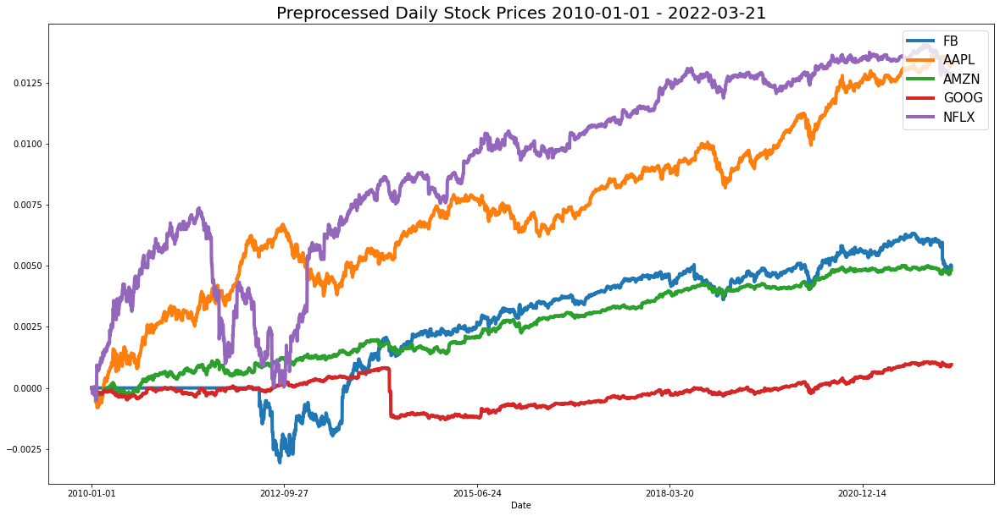

In [2]:
stock_abbrevs=['FB','AAPL','AMZN','GOOG','NFLX']
start_date='2010-01-01'
end_date='2022-03-21'
daily_stock_prices_df= FetchPrices(stock_abbrevs, 'stock').fetch_daily_prices_df(start_date , end_date)
plot_df(daily_stock_prices_df,title='Preprocessed Daily Stock Prices {} - {}'.format(start_date, end_date))

## Lead-Lag Matrix

Now, we are ready to run Cyclicity Analysis. In the code cell below, we output the heatmap representation of the $N \times N$ lead-lag matrix corresponding to our $N$ preprocessed time-series.

In [3]:
DailyStockCA=CyclicityAnalysis(daily_stock_prices_df)
DailyStockCA.plot_lead_lag_df(color_label='Precedence Strength')

## Top 10 Leader Follower Pairs

We plot the top $10$ pairs of time-series with highest oriented areas (precedence strengths) according to the heatmap, along with their corresponding accumulated oriented area plots throughout the decade.

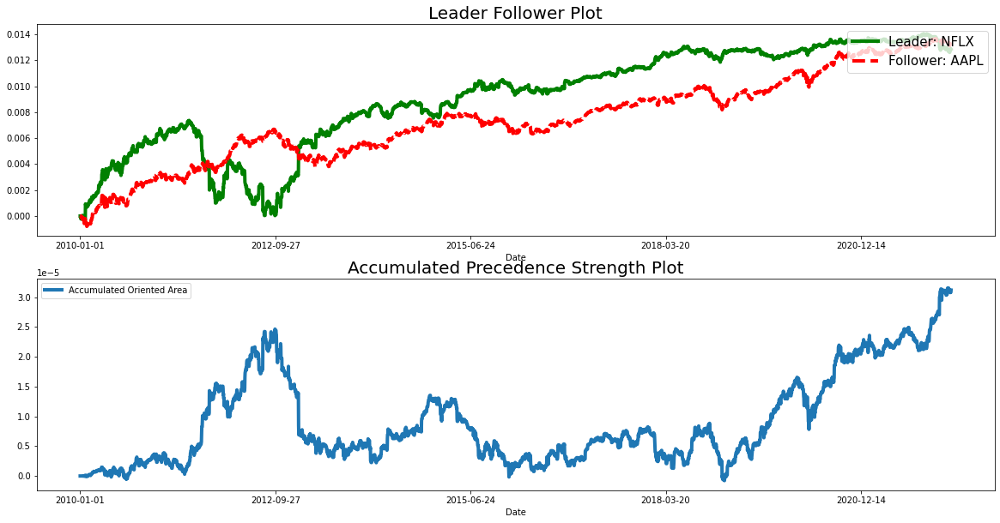

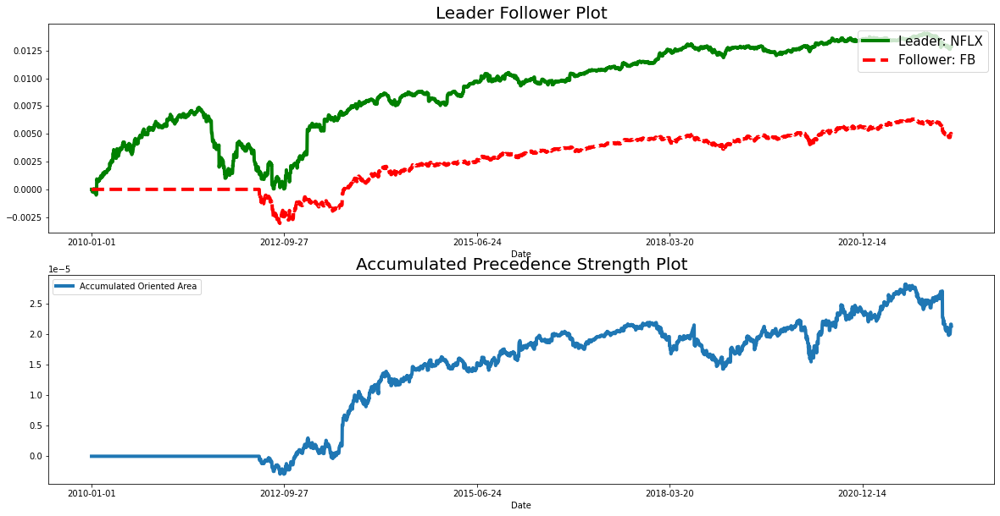

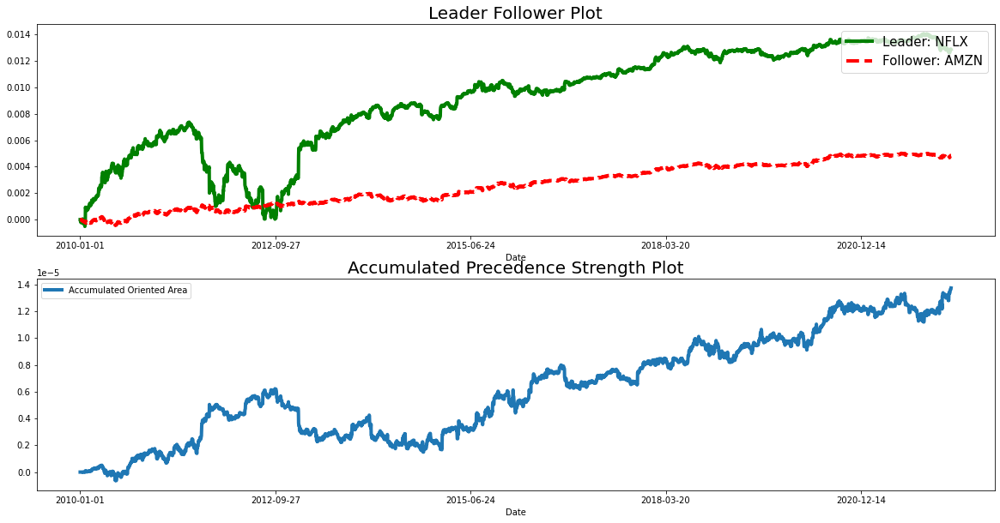

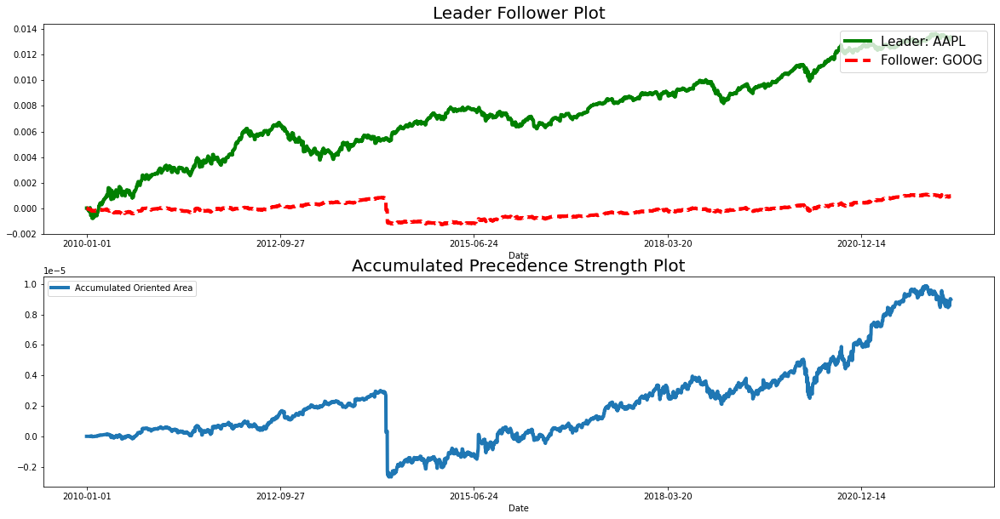

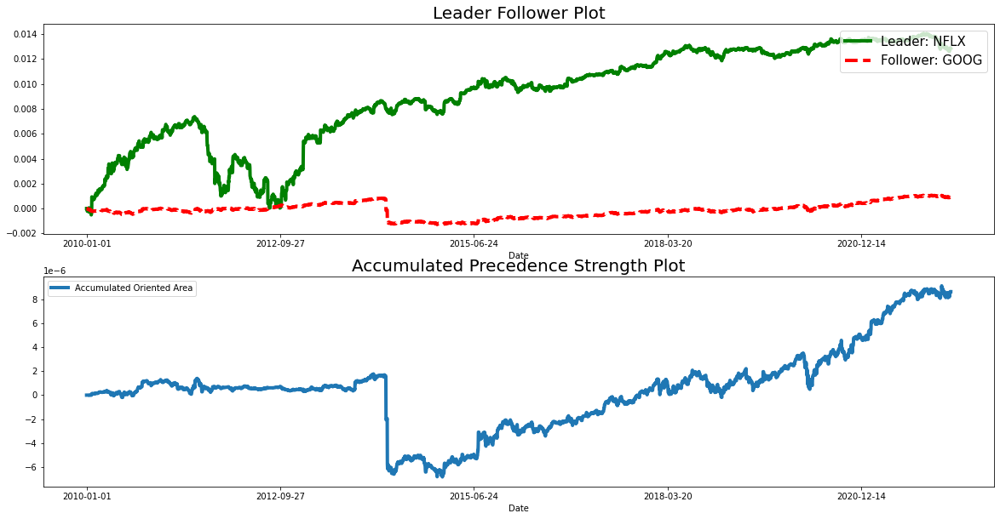

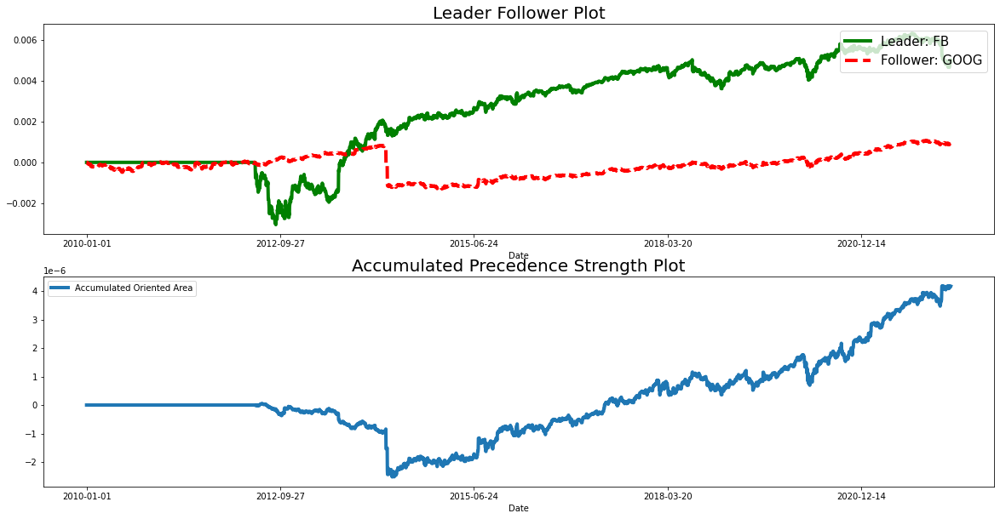

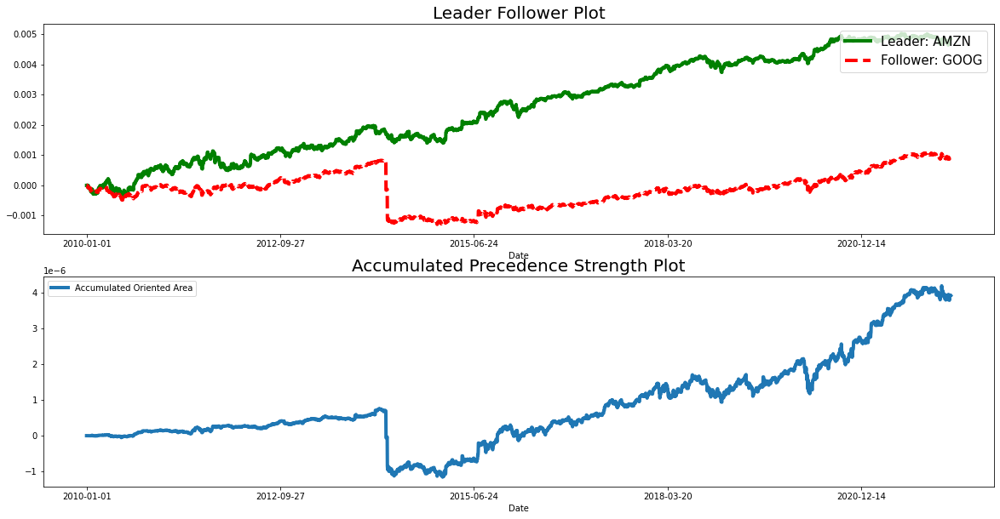

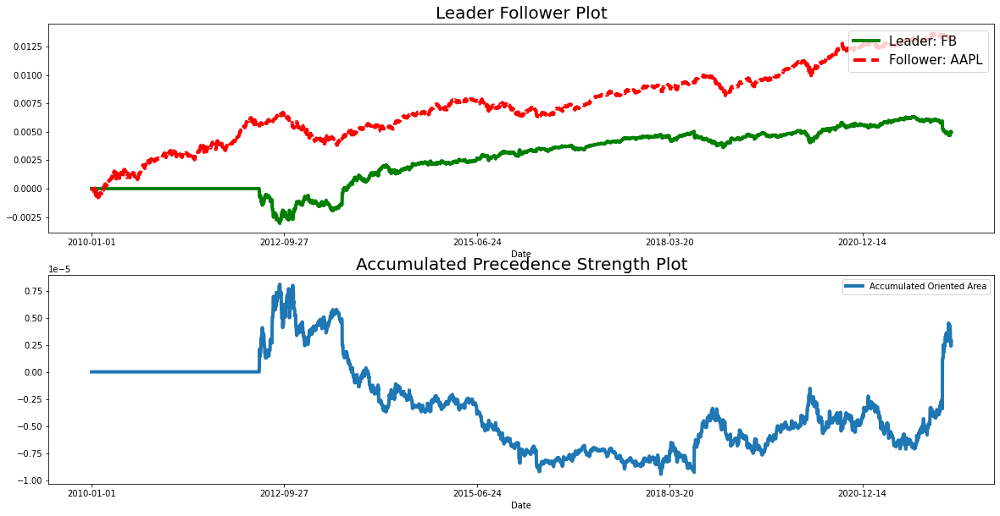

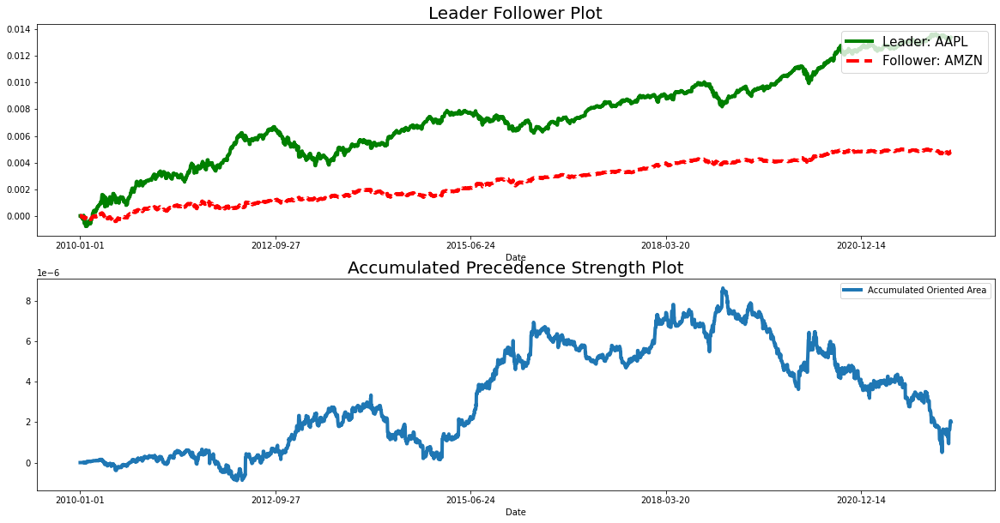

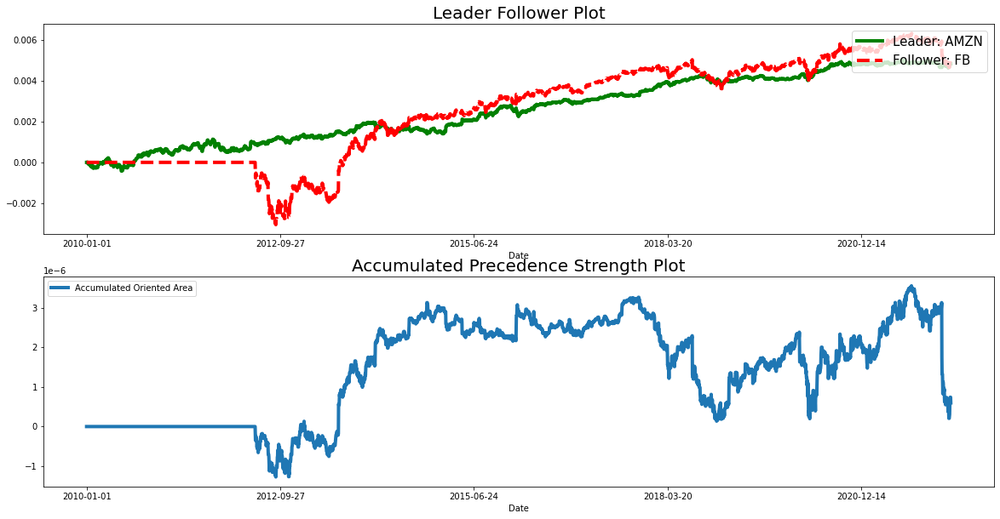

In [4]:
top_pairs = DailyStockCA.get_topN_leader_follower_pairs(N=10)
for pair in top_pairs:
    leader, follower = pair
    plot_leader_follower_relationship(daily_stock_prices_df, leader, follower, 
                                      include_accumulated_oriented_area_plot= True)

# Cyclicity Analysis of Intraday Stock Prices

Select $N$ companies from the market, and fix a particular trading day. Define the collection of timestamps $\lbrace t_m \rbrace_{m=0}^n,$ where $t_m$ is the timestamp corresponding to $m$ minutes since 9:30 A.M. EST of our chosen day and $t_n$ is the timestamp corresponding to 4:00 P.M. EST of our chosen day. As before, let $\left \lbrace x^{(k)}_{t_m} \right \rbrace_{m=0}^n$ be the time-series such that each $x^{(k)}_{t_m}$ is the $k$-th company's closing price after $t_m.$

## Data Preprocessing

 We preprocess each intraday time-series using the following procedure:

* Normalization
* Forward-filling
* Back-filling
* Translation

We implement this in the code cell below.


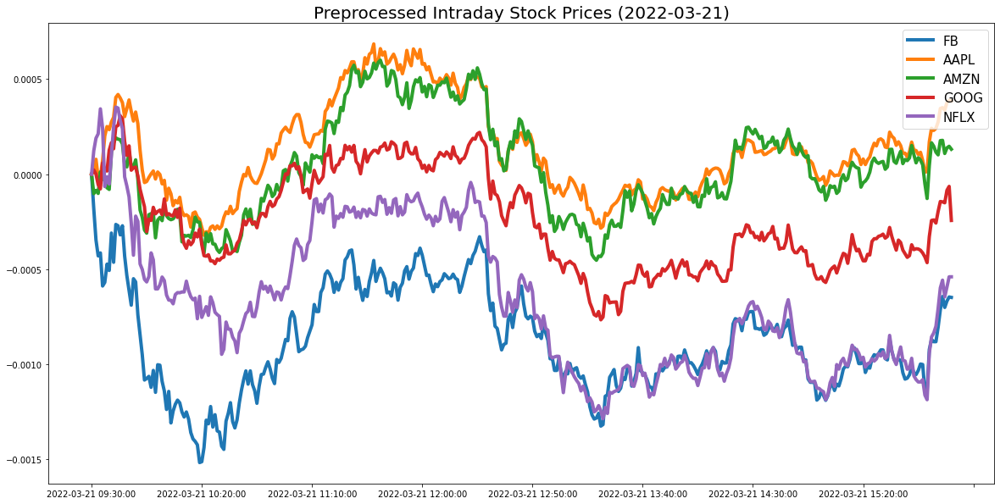

In [5]:
stock_abbrevs=['FB','AAPL','AMZN','GOOG','NFLX']
date="2022-03-21"

intraday_stock_prices_df= FetchPrices(stock_abbrevs, 'stock').fetch_intraday_prices_df(date)
plot_df(intraday_stock_prices_df,
        title='Preprocessed Intraday Stock Prices ({})'.format(date))

## Lead Lag Matrix

We run Cyclicity Analysis on the intraday stock price time-series. We output the heatmap of the $N \times N$ lead lag matrix.

In [6]:
IntradayStockCA=CyclicityAnalysis(intraday_stock_prices_df)
IntradayStockCA.plot_lead_lag_df()

## Top 10 Leader Follower Pairs

We obtain the the top $10$ pairs of intraday stock price time-series with the highest oriented areas according to the heatmap. For each pair, we plot the leader follower relationship and their accumulated precedence strength throughout the trading day.

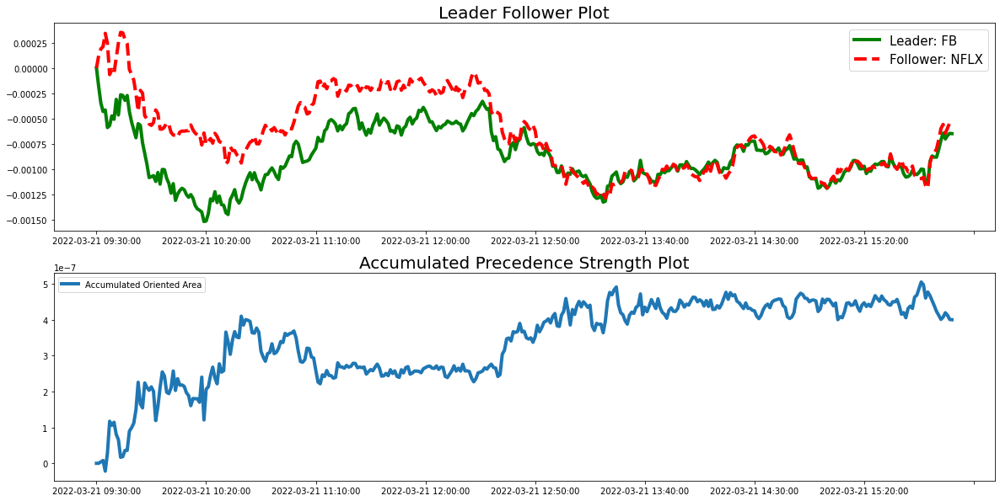

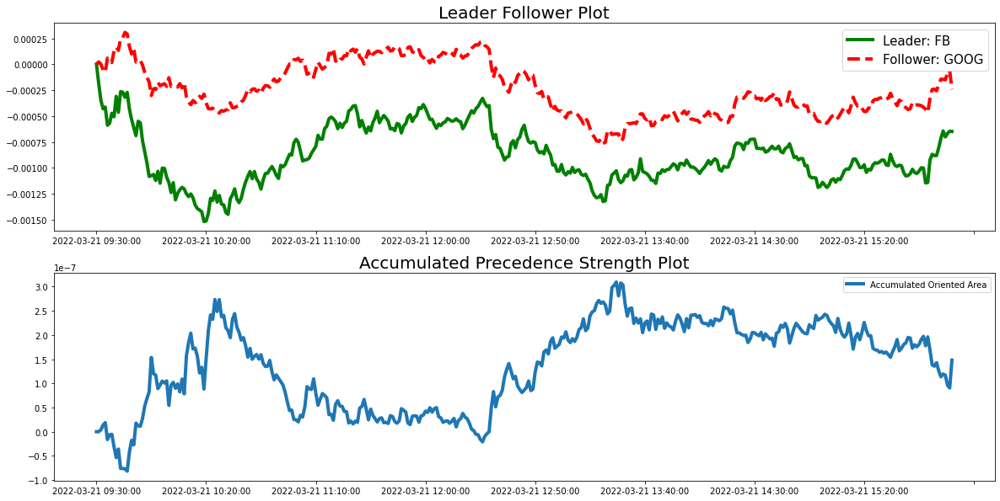

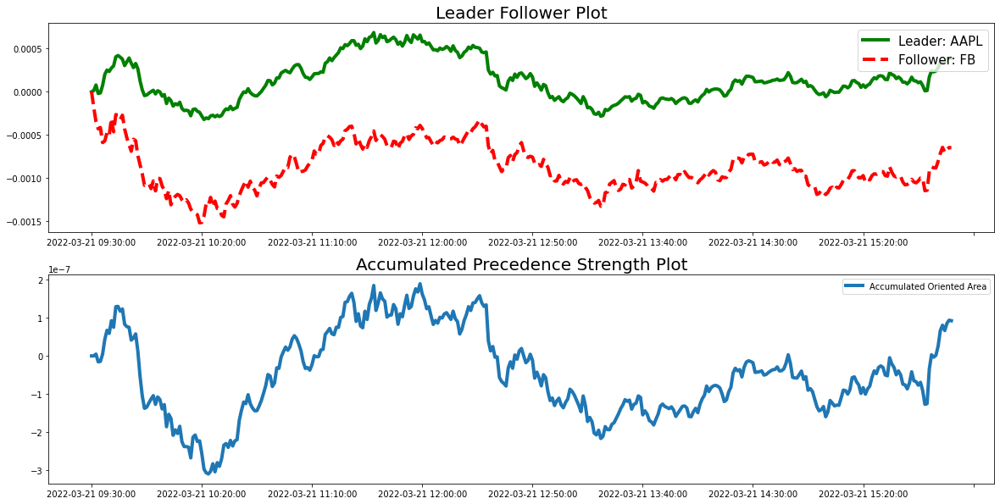

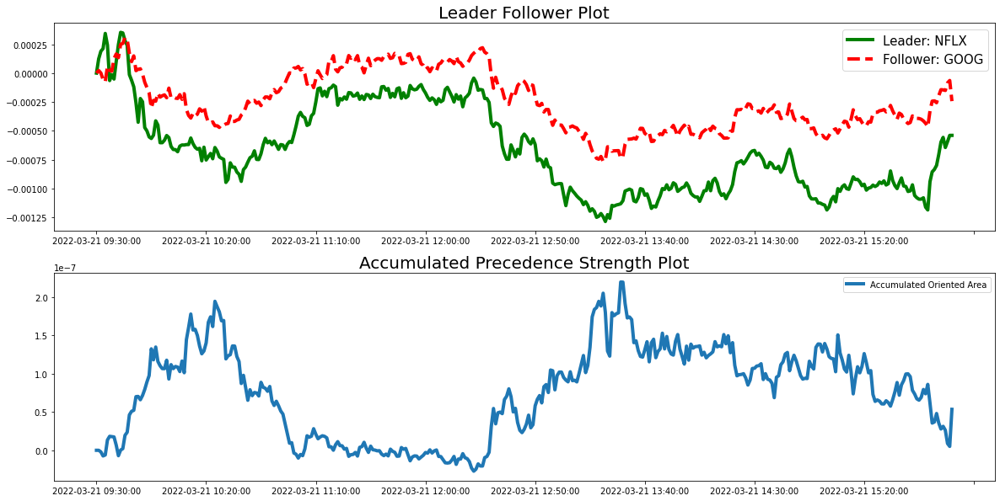

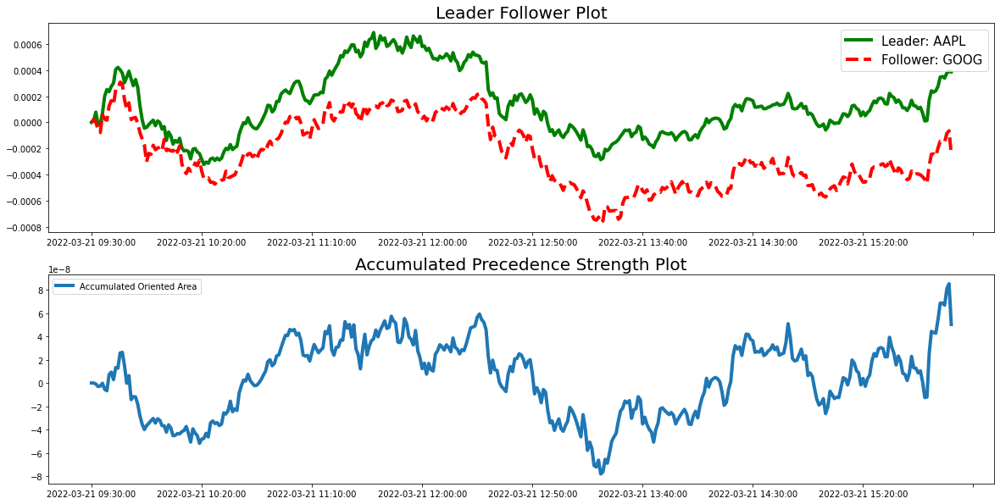

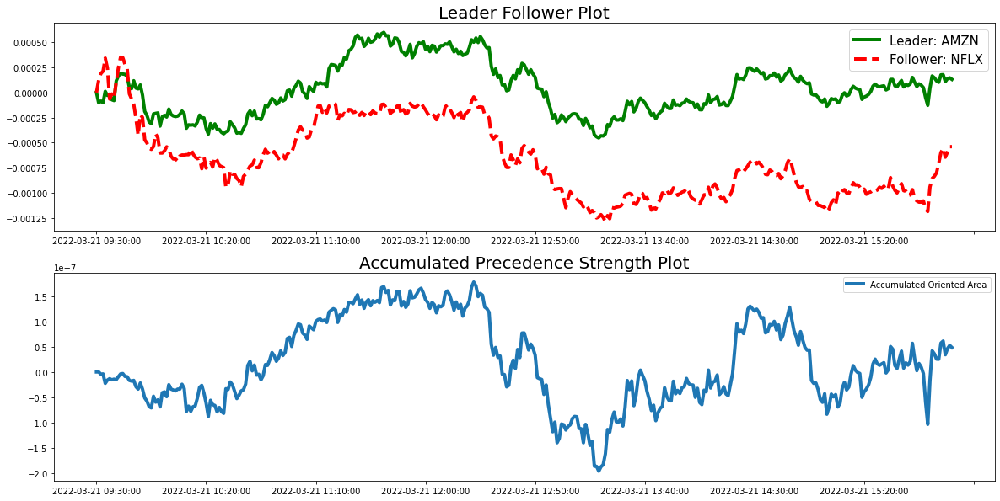

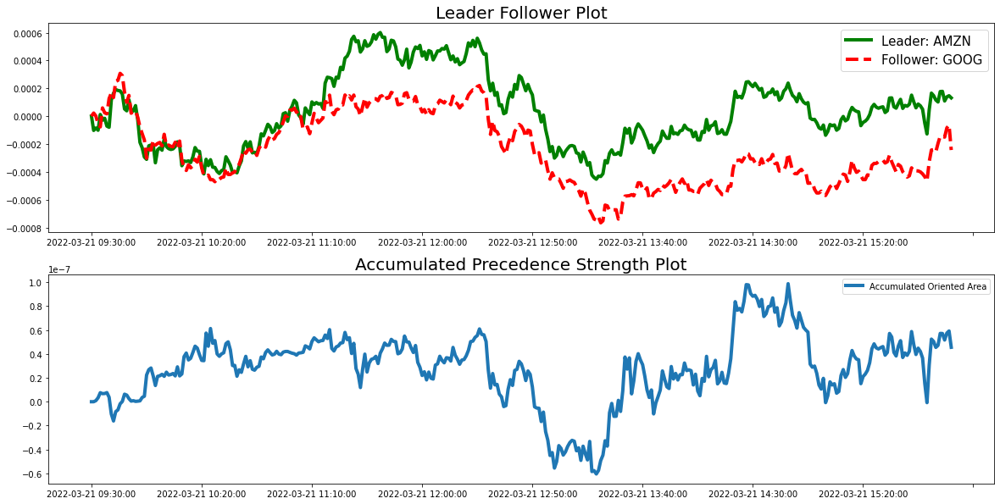

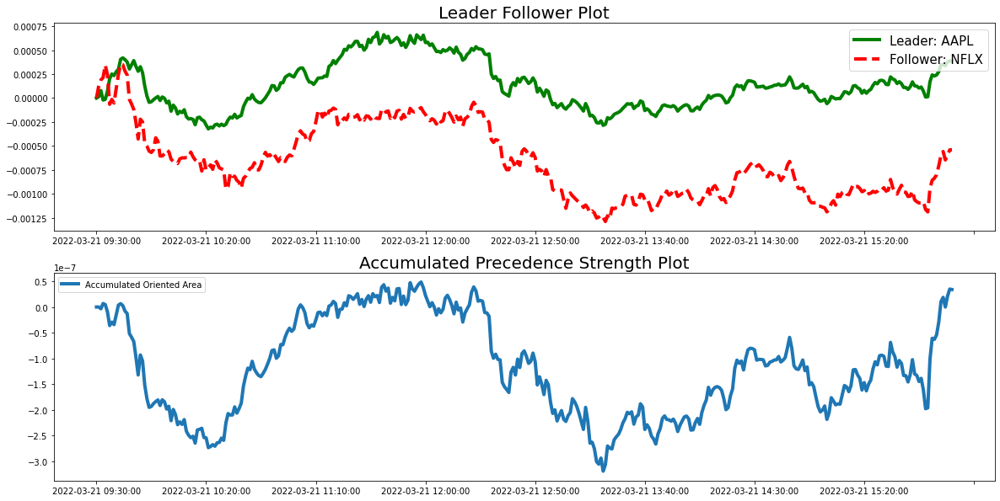

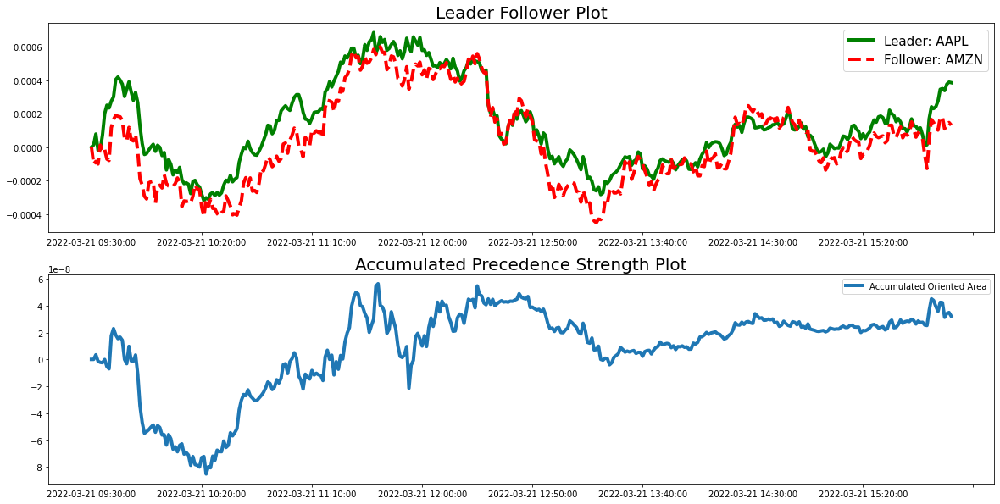

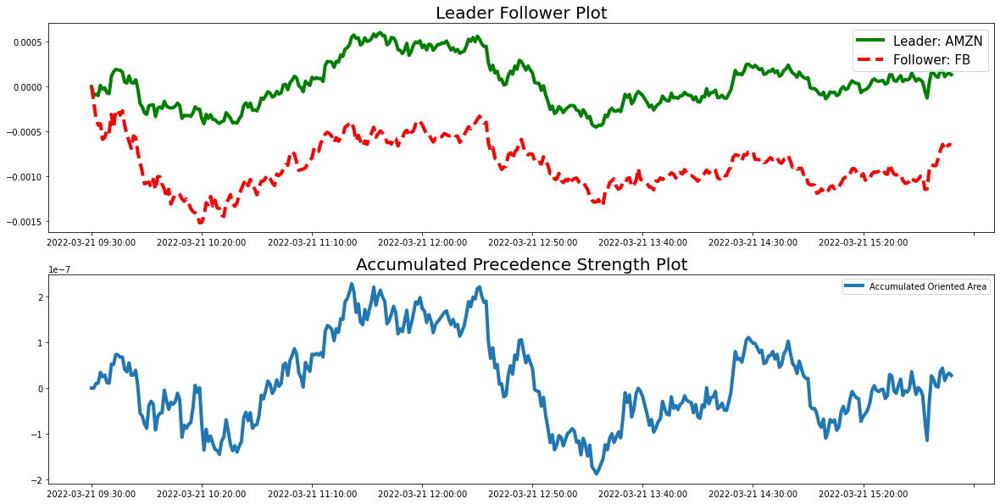

In [7]:
for pair in IntradayStockCA.get_topN_leader_follower_pairs(N=10):
    leader,follower=pair
    plot_leader_follower_relationship(intraday_stock_prices_df, 
                                      leader, 
                                      follower, 
                                      figsize=(20,10))

## Intraday Stock Price Leader Follower Statistics by S&P 500 Index

The $500$ most influential companies in the Stock Market are divided into $11$ different categories, known as $\textbf{S&P 500 sectors (indices)},$ which are listed below. 

* [Comsumer Discretionary]( https://www.tradingview.com/symbols/SP-S5COND/components/)
* [Financials](https://www.tradingview.com/symbols/SP-SPF/components/)
* [Energy](https://www.tradingview.com/symbols/SP-SPN/components/)
* [Information Technology](https://www.tradingview.com/symbols/SP-S5INFT/components/)
* [Health Care](https://www.tradingview.com/symbols/SP-S5HLTH/components/)
* [Materials](https://www.tradingview.com/symbols/SP-S5MATR/components/)
* [Consumer Staples](https://www.tradingview.com/symbols/SP-S5CONS/components/)
* [Communication Services](https://www.tradingview.com/symbols/SP-S5TELS/components/)
* [Real Estate](https://www.tradingview.com/symbols/SP-S5REAS/components/)
* [Industrials](https://www.tradingview.com/symbols/SP-S5INDU/components/)
* [Utilities](https://www.tradingview.com/symbols/SP-S5UTIL/components/)

In the code cell below, we obtain the list of companies belonging to an S&P 500 sector. The companies are represented by their stock market abbreviations. Suppose a sector has $N$ companies. We obtain the $\textbf{strong frequency count matrix},$ which is an $N \times N$ matrix whose entry $C_{i,j}$ is the number of days in which company $j$ followed company $i$ strongly i.e. the number of days the corresponding oriented area for $i$ and $j$ appeared in the top $10$ highest of values.

In [8]:
def get_SP_500_sector_stock_abbrevs(sector_name):
    file_path="S&P 500 Companies/{}.csv".format(sector_name)
    SP_500_sector_stock_abbrevs_df=pd.read_csv(file_path,index_col=0)    
    SP_500_sector_stock_abbrevs= list(SP_500_sector_stock_abbrevs_df[SP_500_sector_stock_abbrevs_df.columns[0]].unique())

    return SP_500_sector_stock_abbrevs


SP_500_sector_names=['Consumer Discretionary','Financials','Energy','Information Technology', 
                     'Health Care', 'Materials', 'Consumer Staples', 'Communication Services', 
                     'Real Estate', 'Industrials', 'Utilities']



start_date, end_date ='2022-01-01', '2022-03-21'

for sector_name in SP_500_sector_names:
    print("FETCHING STRONG FREQUENCY MATRIX FOR S&P 500 {} ({} - {}) ...".format(sector_name,start_date, end_date))
    save_directory="S&P 500 {} Intraday Leader Followers".format(sector_name)
    stock_abbrevs=get_SP_500_sector_stock_abbrevs(sector_name)
    LFA=LeaderFollowerFrequencyAnalysis(stock_abbrevs,'stock',start_date, end_date,save_directory=save_directory)
    LFA.plot_strong_frequency_counts_df(title='S&P 500 {} Strong Frequency Matrix ({} - {})'.format(sector_name, start_date, end_date))

FETCHING STRONG FREQUENCY MATRIX FOR S&P 500 Consumer Discretionary (2022-01-01 - 2022-03-21) ...


/Users/VivekKaushik 1/PycharmProjects/StockMarketAnalysis/LeaderFollowerFrequencyAnalysis.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/VivekKaushik 1/PycharmProjects/StockMarketAnalysis/LeaderFollowerFrequencyAnalysis.py:65: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



FETCHING STRONG FREQUENCY MATRIX FOR S&P 500 Financials (2022-01-01 - 2022-03-21) ...


FETCHING STRONG FREQUENCY MATRIX FOR S&P 500 Energy (2022-01-01 - 2022-03-21) ...


FETCHING STRONG FREQUENCY MATRIX FOR S&P 500 Information Technology (2022-01-01 - 2022-03-21) ...


FETCHING STRONG FREQUENCY MATRIX FOR S&P 500 Health Care (2022-01-01 - 2022-03-21) ...


FETCHING STRONG FREQUENCY MATRIX FOR S&P 500 Materials (2022-01-01 - 2022-03-21) ...


FETCHING STRONG FREQUENCY MATRIX FOR S&P 500 Consumer Staples (2022-01-01 - 2022-03-21) ...


FETCHING STRONG FREQUENCY MATRIX FOR S&P 500 Communication Services (2022-01-01 - 2022-03-21) ...


FETCHING STRONG FREQUENCY MATRIX FOR S&P 500 Real Estate (2022-01-01 - 2022-03-21) ...


FETCHING STRONG FREQUENCY MATRIX FOR S&P 500 Industrials (2022-01-01 - 2022-03-21) ...


FETCHING STRONG FREQUENCY MATRIX FOR S&P 500 Utilities (2022-01-01 - 2022-03-21) ...


# Cyclicity Analysis of Daily Cryptocurrency Prices

Select $N$ cryptocurrencies. Fix a starting date and ending date. Define the collection of timestamps $\lbrace t_m \rbrace_{m=0}^n,$ where $t_m$ is the timestamp corresponding to $m$ days since our starting date and $t_n$ is the timestamp corresponding to the ending date. Let $\left \lbrace x^{(k)}_{t_m} \right \rbrace_{m=0}^n$ be the time-series such that each $x^{(k)}_{t_m}$ is the $k$-th cryptocurrency's closing price value (converted to USD) after $t_m.$  

## Data Preprocessing

We preprocess each daily cryptocurrency price value time-series in the same way as we did with the daily stock price time-series. We implement this in the code cell below.

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pandas/core/arraylike.py:364: RuntimeWarning:

invalid value encountered in log



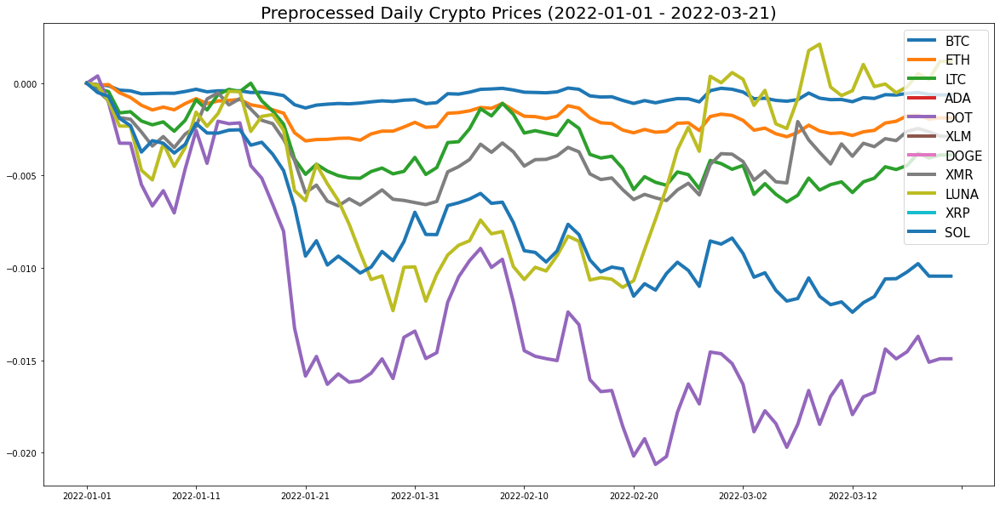

In [9]:
crypto_abbrevs = ['BTC','ETH','LTC','ADA','DOT','XLM','DOGE','BNB','XMR','LUNA','XRP','SOL']
start_date, end_date ='2022-01-01','2022-03-21'


daily_crypto_prices_df=FetchPrices(crypto_abbrevs, 'crypto').fetch_daily_prices_df(start_date, end_date)
plot_df(daily_crypto_prices_df,
        title='Preprocessed Daily Crypto Prices ({} - {})'.format(start_date, end_date))


## Lead Lag Matrix

In [10]:
DailyCryptoCA=CyclicityAnalysis(daily_crypto_prices_df)
DailyCryptoCA.plot_lead_lag_df()

## Top 10 Leader Follower Pairs

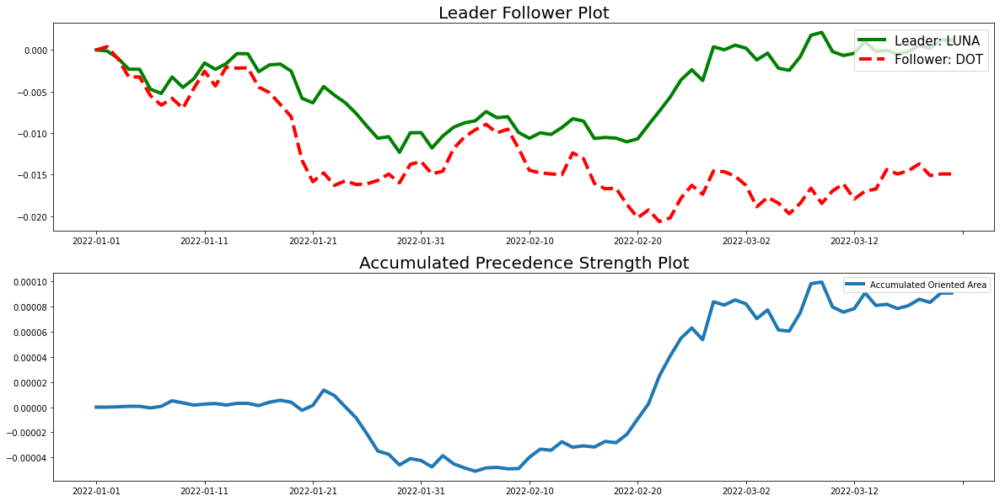

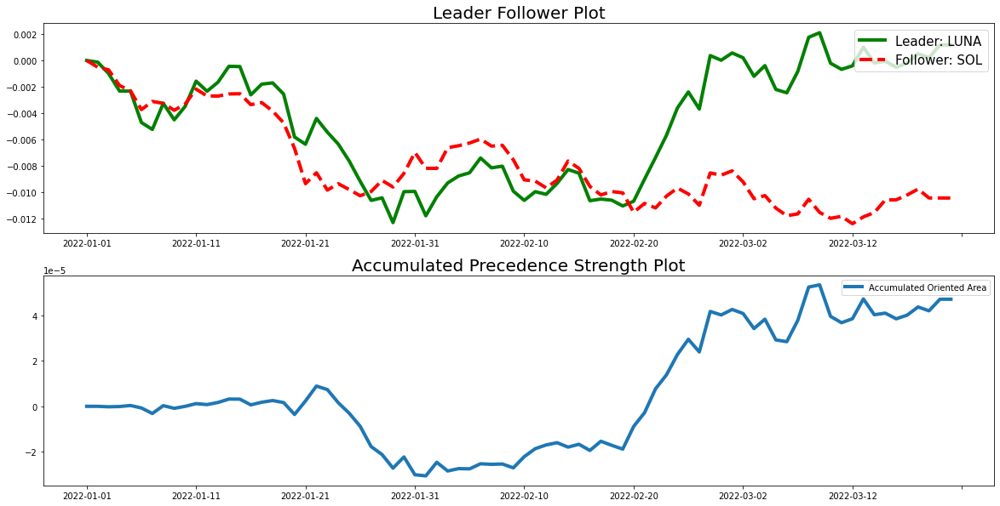

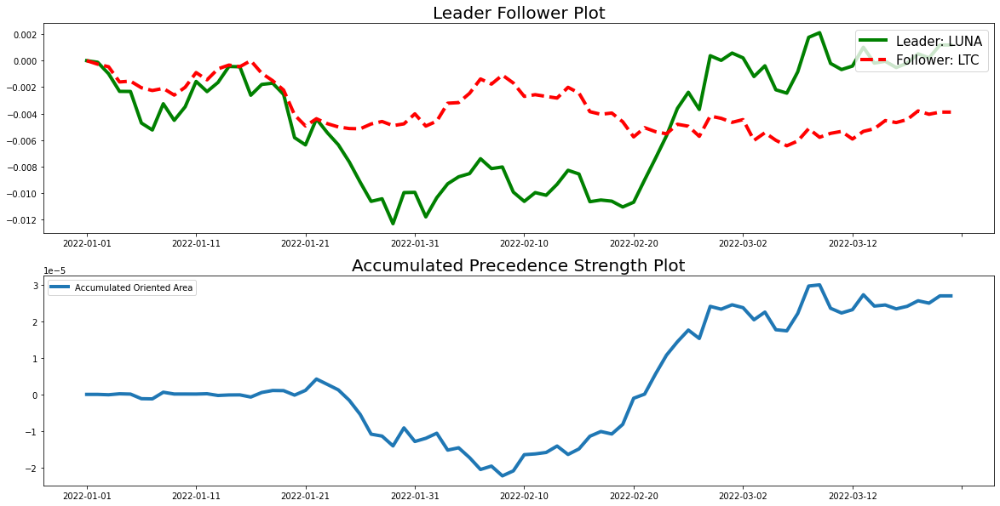

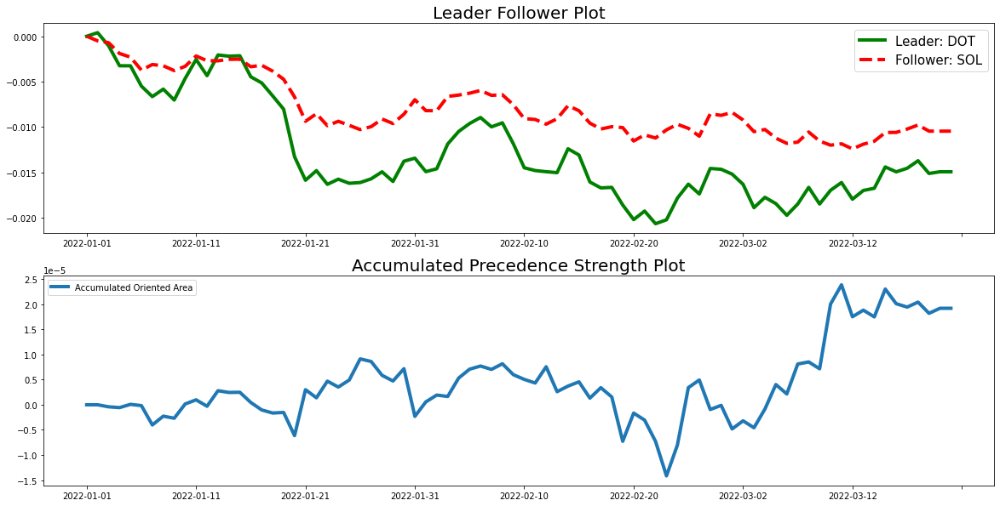

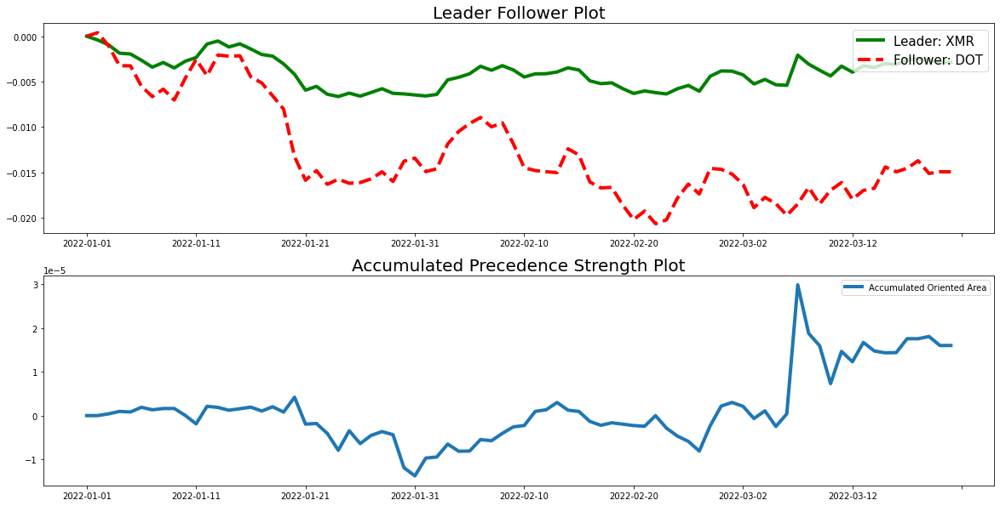

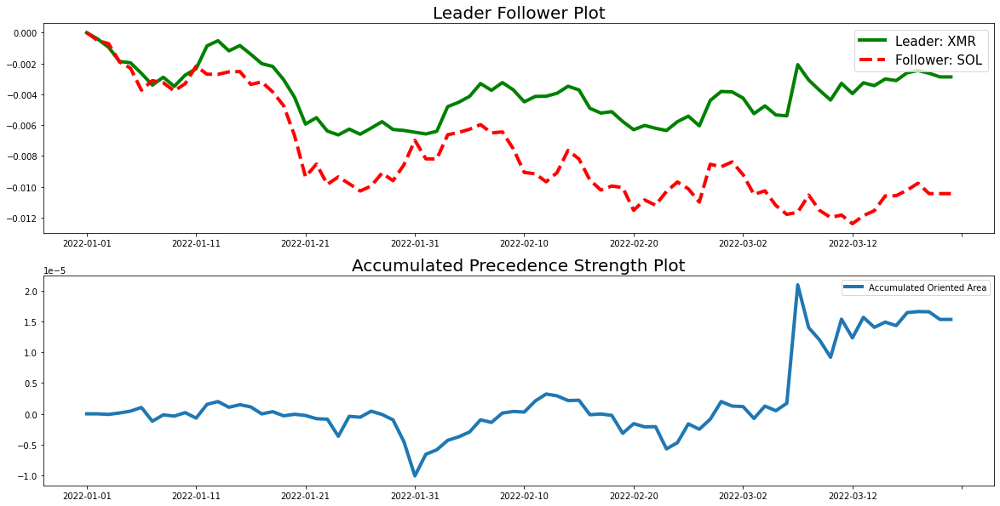

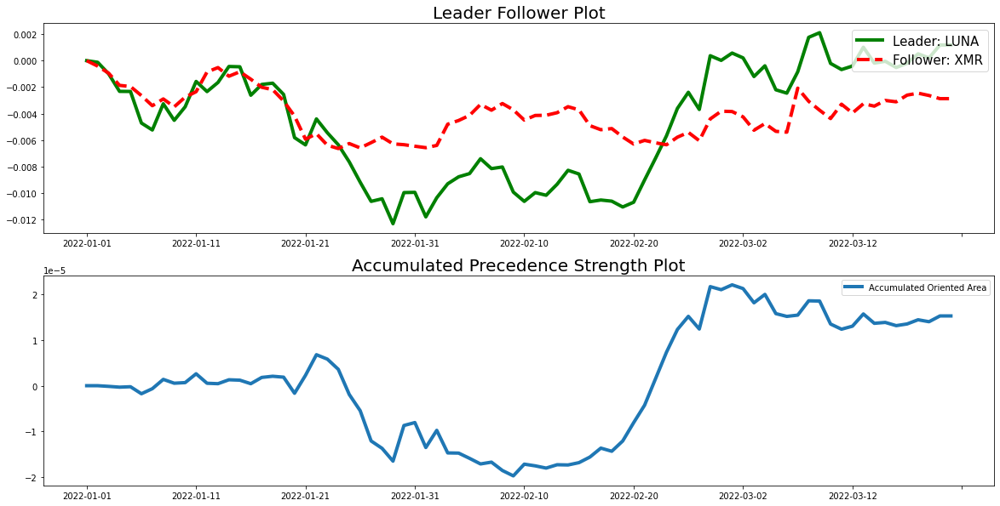

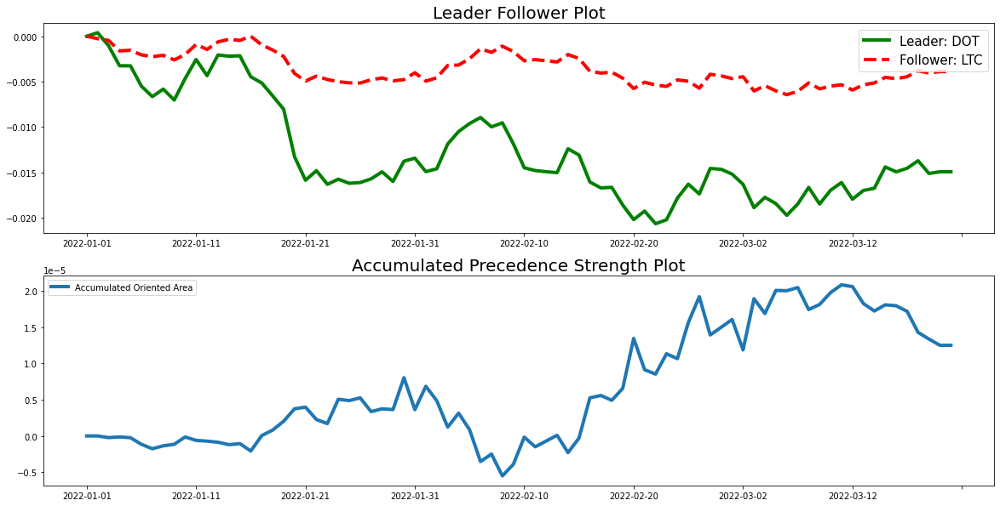

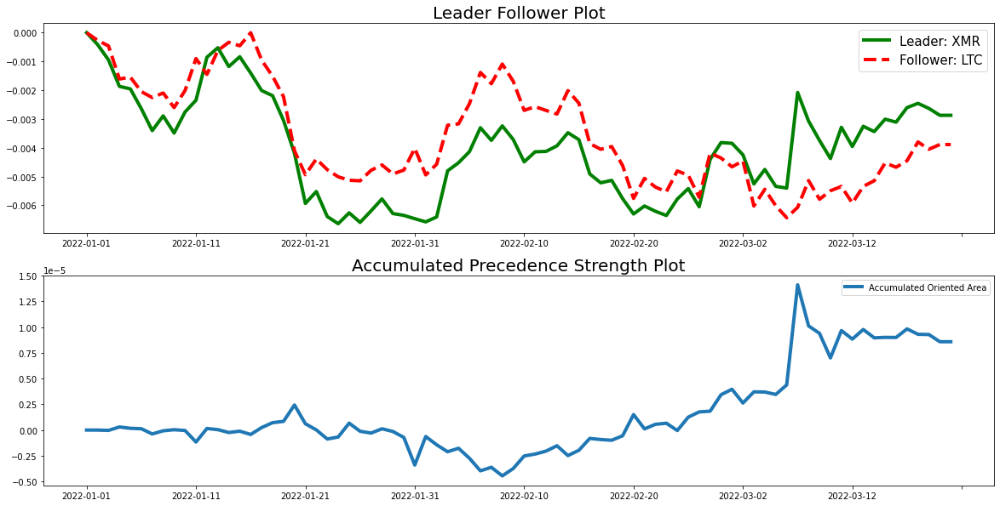

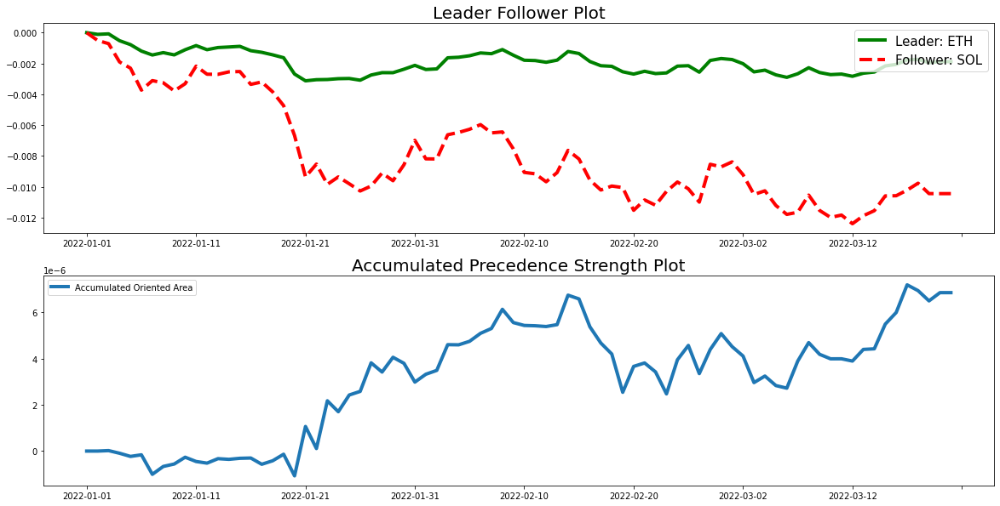

In [11]:
for pair in DailyCryptoCA.get_topN_leader_follower_pairs(N=10):
    leader,follower=pair
    plot_leader_follower_relationship(daily_crypto_prices_df, 
                                          leader, 
                                          follower, 
                                          figsize=(20,10),
                                          include_accumulated_oriented_area_plot=True)

# Cyclicity Analysis of Intraday Cryptocurrency Prices

Select $N$ cryptocurrencies. Fix a particular trading day. Define the collection of timestamps $\lbrace t_m \rbrace_{m=0}^n,$ where $t_m$ is the timestamp corresponding to $m$ minutes since 9:30 A.M. EST of our chosen day and $t_n$ is the timestamp corresponding to 4:00 P.M. EST of our chosen day. As before, let $\left \lbrace x^{(k)}_{t_m} \right \rbrace_{m=0}^n$ be the time-series such that each $x^{(k)}_{t_m}$ is the $k$-th cryptocurrency's closing price value after $t_m.$ 

## Data Preprocessing

We preprocess each intraday cryptocurrency price time-series as we did with intraday stock price time-series. We implement this in the code cell below.

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



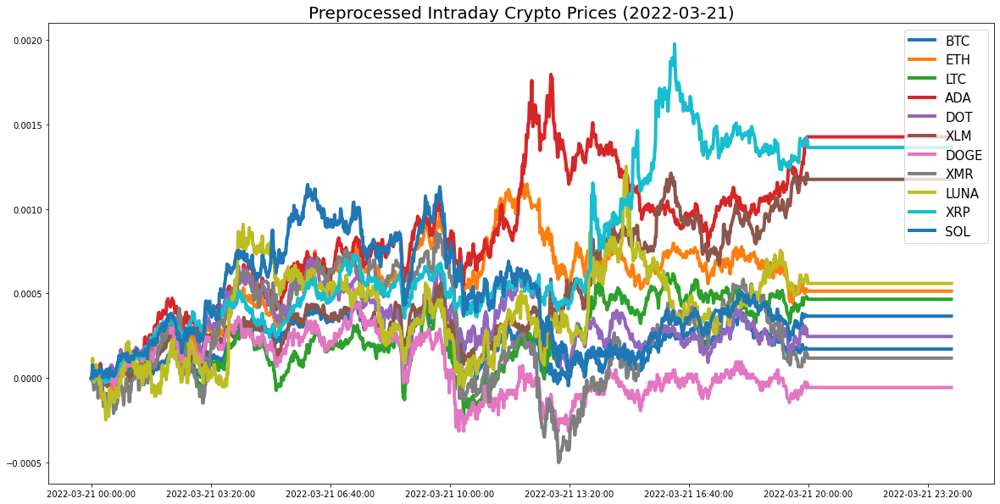

In [12]:
crypto_abbrevs = ['BTC','ETH','LTC','ADA','DOT','XLM','DOGE','BNB','XMR','LUNA','XRP','SOL']
date = '2022-03-21'


intraday_crypto_prices_df=FetchPrices(crypto_abbrevs, 'crypto').fetch_intraday_prices_df(date)
plot_df(intraday_crypto_prices_df,
        title='Preprocessed Intraday Crypto Prices ({})'.format(date))


## Lead Lag Matrix

In [13]:
IntradayCryptoCA=CyclicityAnalysis(intraday_crypto_prices_df)
IntradayCryptoCA.plot_lead_lag_df()

## Top 10 Leader Follower Pairs

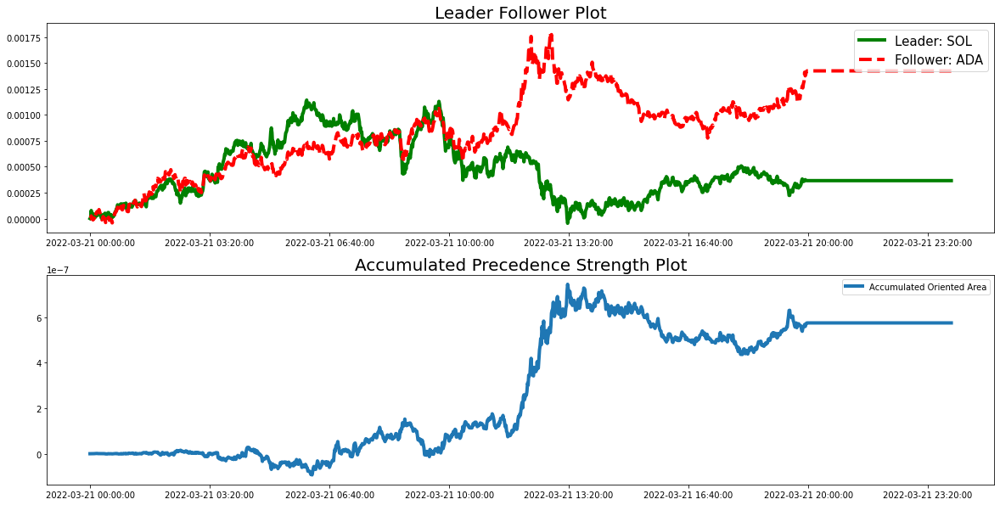

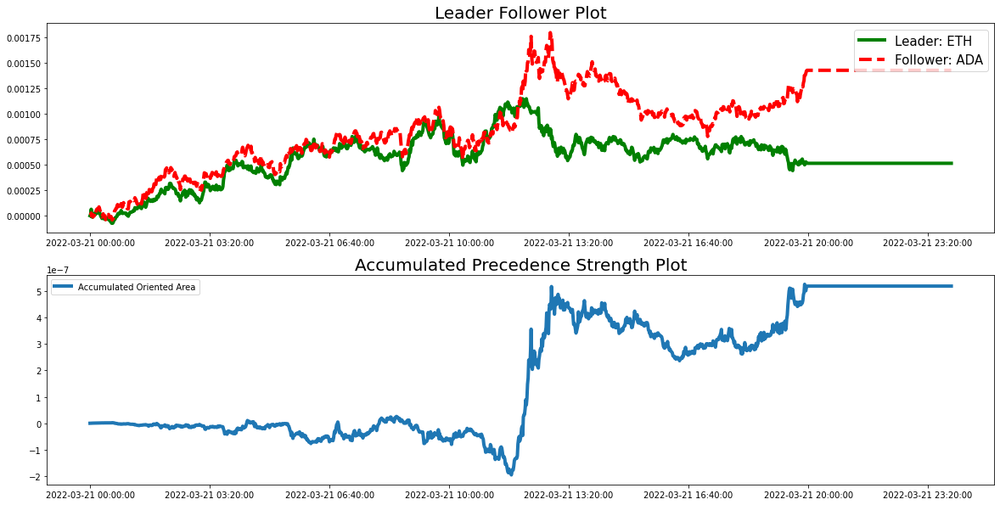

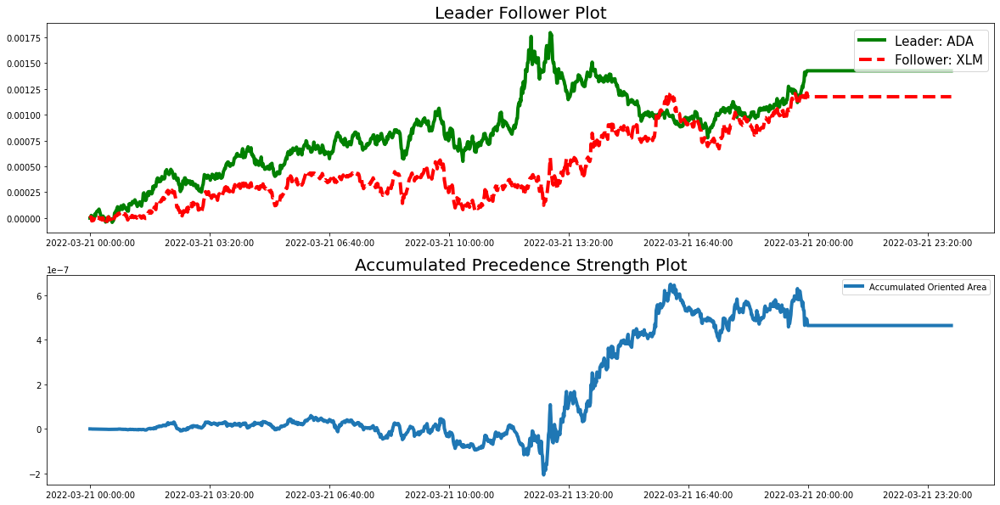

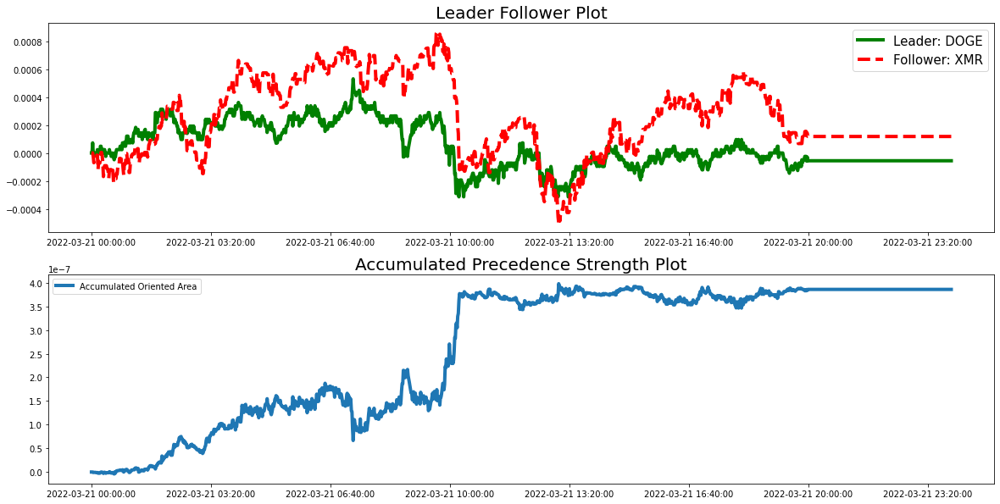

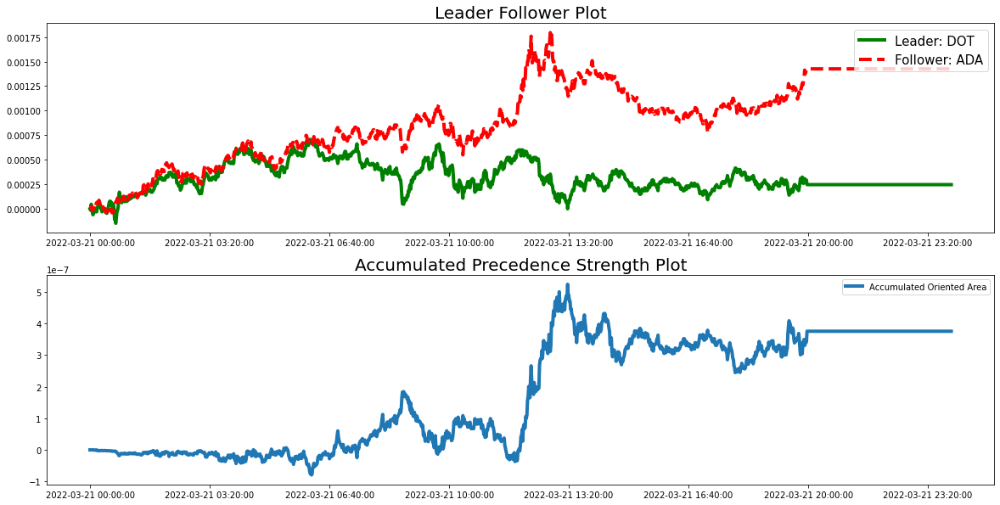

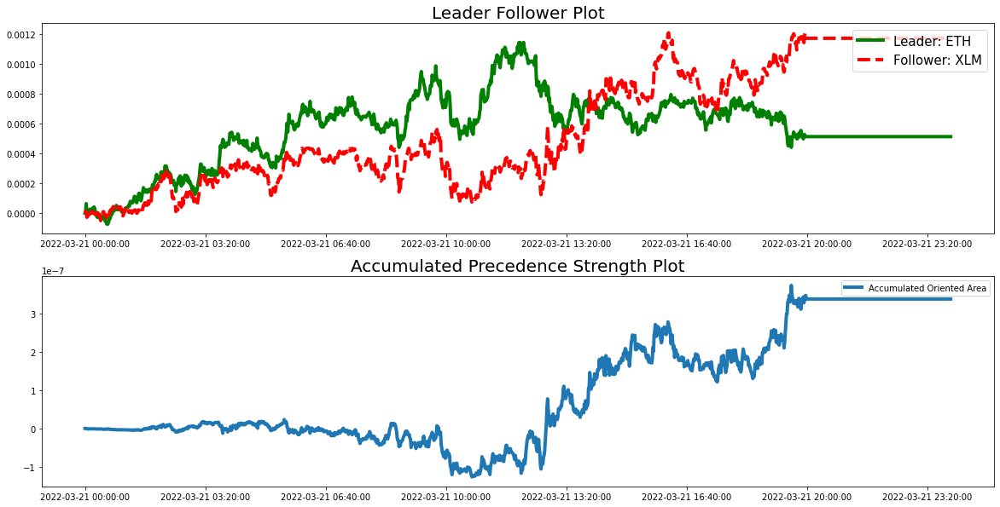

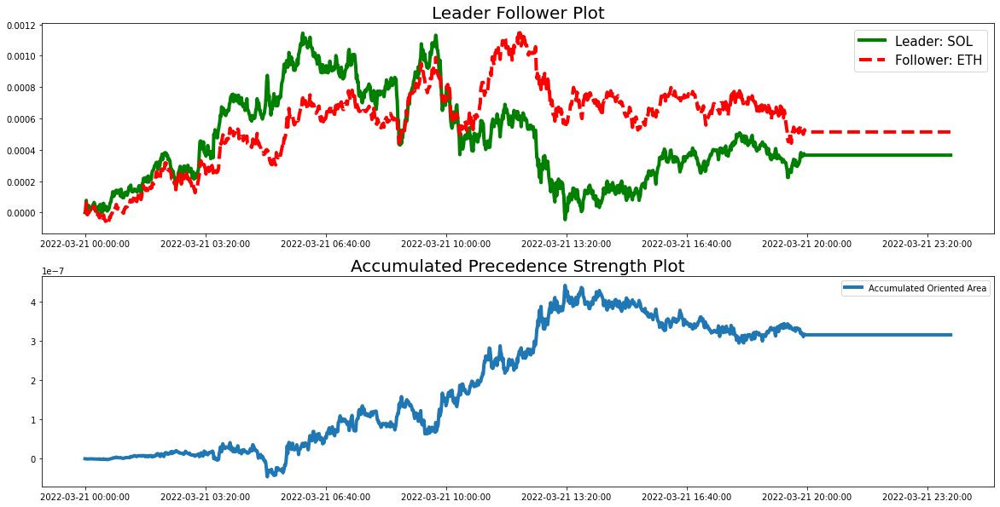

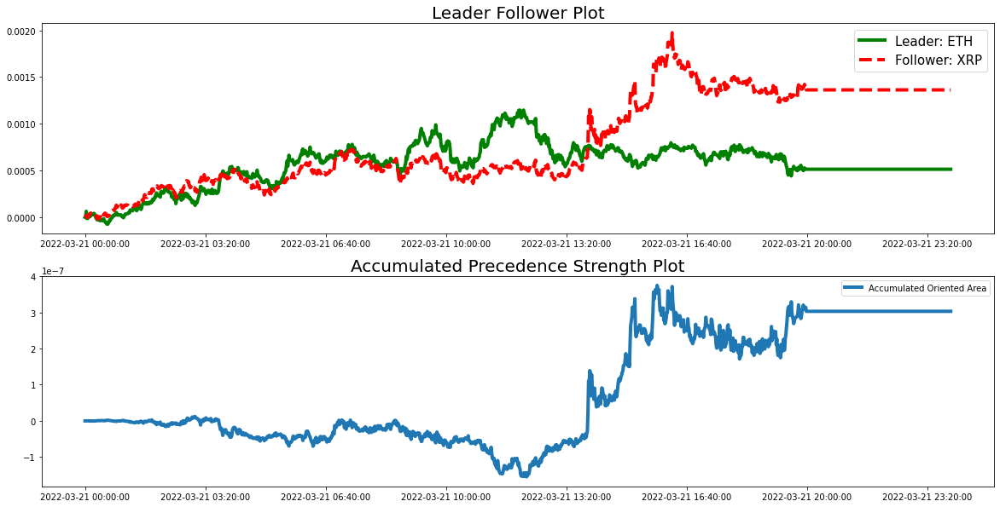

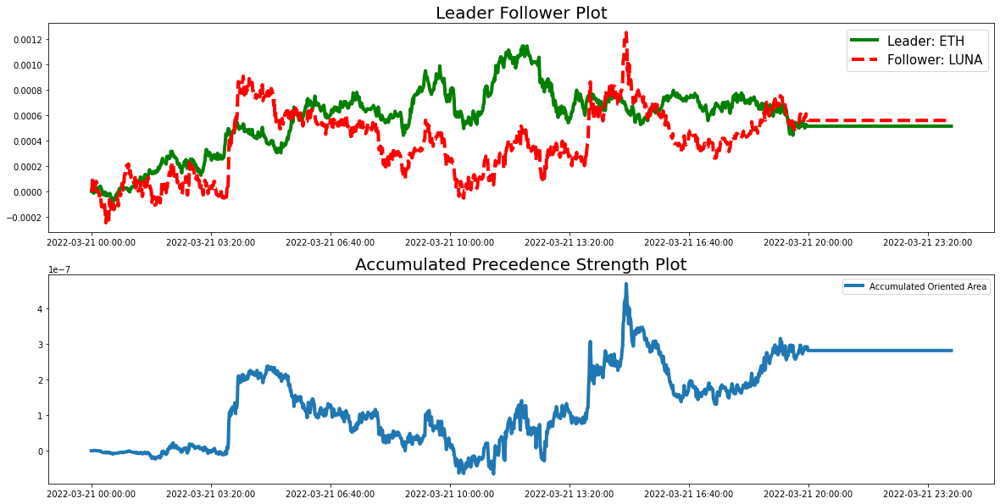

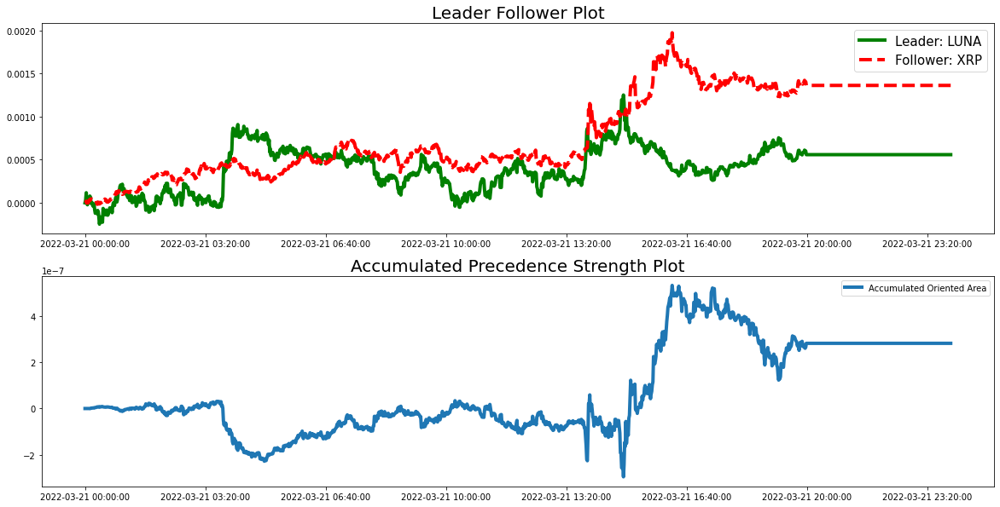

In [14]:
for pair in IntradayCryptoCA.get_topN_leader_follower_pairs(N=10):
    leader,follower=pair
    plot_leader_follower_relationship(intraday_crypto_prices_df, 
                                          leader, 
                                          follower, 
                                          figsize=(20,10),
                                          include_accumulated_oriented_area_plot=True)

## Intraday Cryptocurrency Leader Follower Statistics

We create the strong frequency count matrix for the cryptocurrencies.

In [15]:
save_directory="Cryptocurrency Intraday Leader Followers"
start_date, end_date ='2022-01-01', '2022-03-21'
LFA=LeaderFollowerFrequencyAnalysis(crypto_abbrevs,'crypto',start_date, end_date, save_directory=save_directory)
LFA.plot_strong_frequency_counts_df(title='Crypto Strong Frequency Matrix ({} - {})'.format(start_date, end_date))

/Users/VivekKaushik 1/PycharmProjects/StockMarketAnalysis/LeaderFollowerFrequencyAnalysis.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/VivekKaushik 1/PycharmProjects/StockMarketAnalysis/LeaderFollowerFrequencyAnalysis.py:65: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Cyclicity Analysis of Daily Forex Currency Values

Select $N$ foreign currencies. Fix a starting date and ending date. Define the collection of timestamps $\lbrace t_m \rbrace_{m=0}^n,$ where $t_m$ is the timestamp corresponding to $m$ days since our starting date and $t_n$ is the timestamp corresponding to the ending date. Let $\left \lbrace x^{(k)}_{t_m} \right \rbrace_{m=0}^n$ be the time-series such that each $x^{(k)}_{t_m}$ is the $k$-th foreign currency's closing value (converted to USD) after $t_m.$ 

## Data Preprocessing

We preprocess the each foreign currency's daily value time-series using the following procedure:

* Normalization
* Forward-filling
* Back-filling
* Translation

We implement this in the code cell below.

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pandas/core/arraylike.py:364: RuntimeWarning:

invalid value encountered in log

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



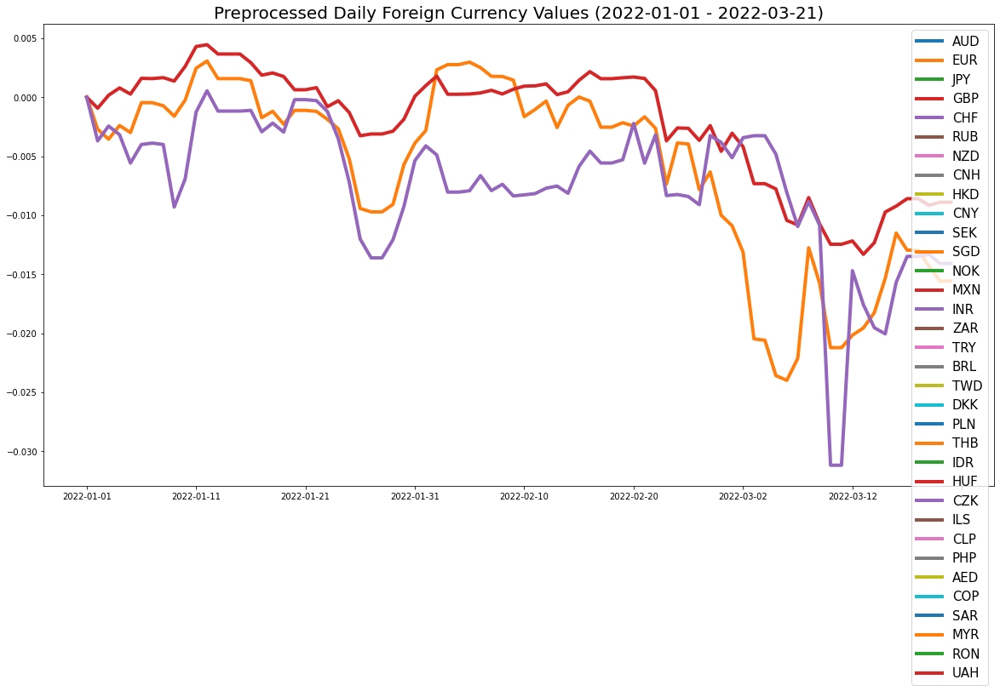

In [16]:
forex_abbrevs = ['AUD','EUR','JPY','GBP','CHF','RUB','USD','NZD','CNH','HKD','CNY',
                    'SEK','SKW','SGD','NOK','MXN','INR','ZAR','TRY','BRL','TWD','DKK',
                    'PLN','THB','IDR','HUF','CZK','ILS','CLP','PHP','AED','COP','SAR',
                    'MYR','RON','UAH'] 

start_date, end_date ='2022-01-01','2022-03-21'

                
daily_forex_prices_df=FetchPrices(forex_abbrevs, 'forex').fetch_daily_prices_df(start_date, end_date)
plot_df(daily_forex_prices_df, title='Preprocessed Daily Foreign Currency Values ({} - {})'.format(start_date,end_date))

## Lead Lag Matrix

In [17]:
DailyForexCA = CyclicityAnalysis(daily_forex_prices_df)
DailyForexCA.plot_lead_lag_df()

## Top 10 Leader Follower Pairs

IndexError: index 0 is out of bounds for axis 0 with size 0

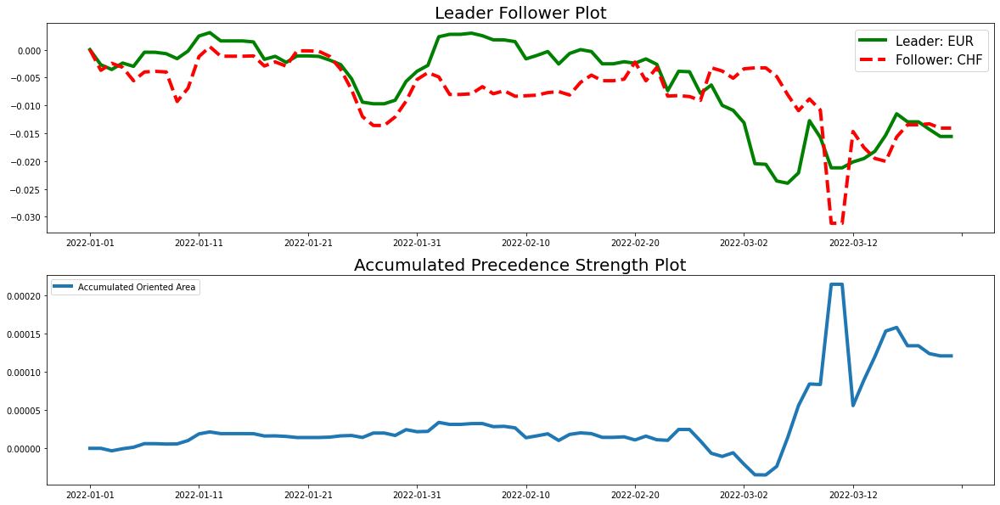

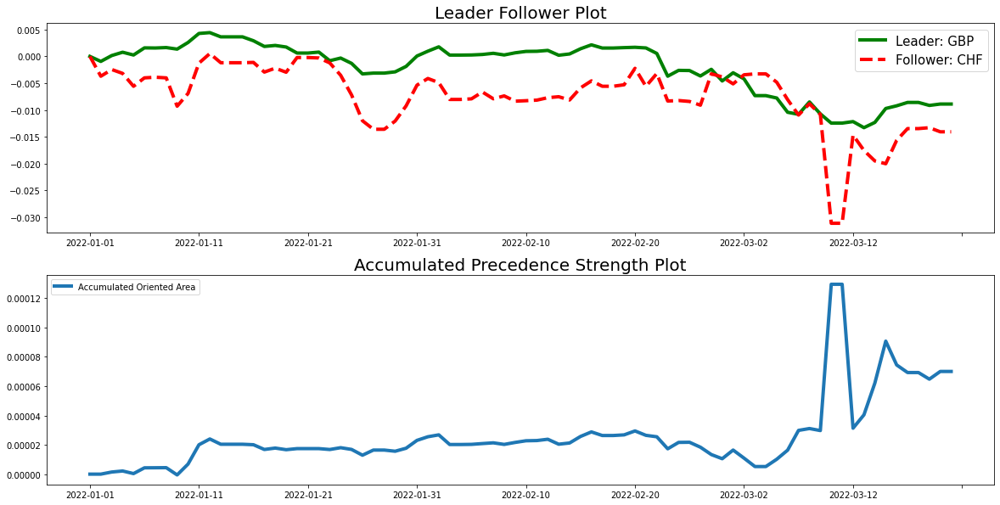

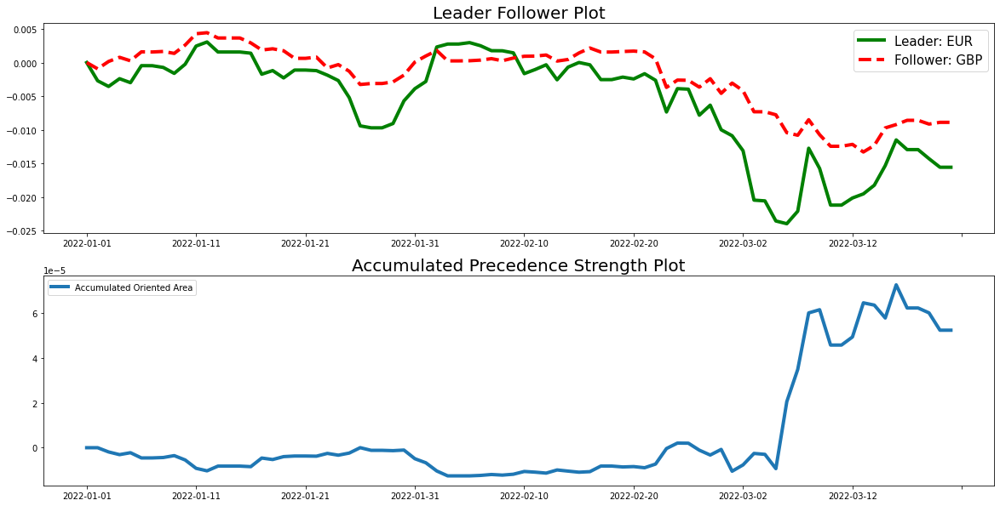

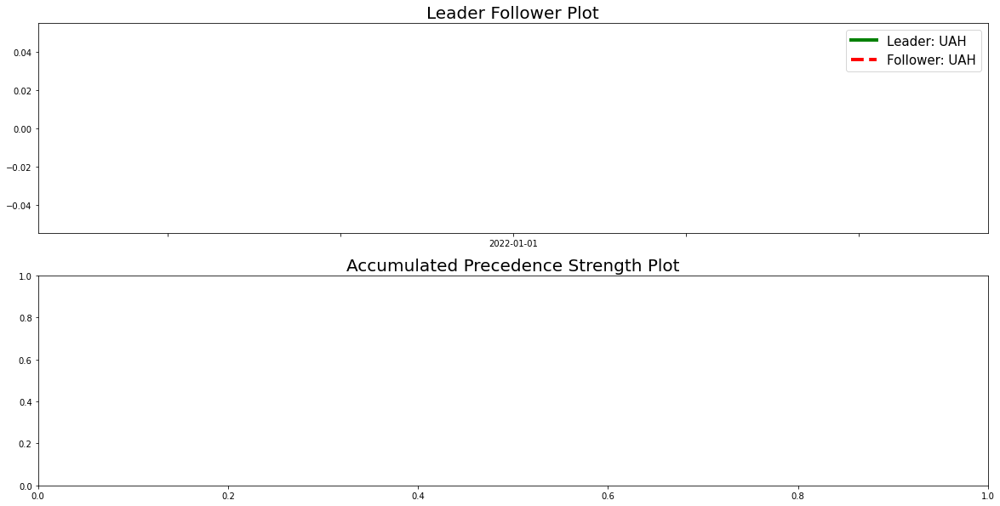

In [18]:
for pair in DailyForexCA.get_topN_leader_follower_pairs(N=10):
    leader,follower=pair
    plot_leader_follower_relationship(daily_forex_prices_df, 
                                          leader, 
                                          follower, 
                                          figsize=(20,10),
                                          include_accumulated_oriented_area_plot=True)

# Cyclicity Analysis of Intraday Forex Currency Values

Select $N$ foreign corruencies. Now, fix a particular trading day. Define the collection of timestamps $\lbrace t_m \rbrace_{m=0}^n,$ where $t_m$ is the timestamp corresponding to $m$ minutes since 8:00 A.M. EST of our chosen day and $t_n$ is the timestamp corresponding to 5:00 P.M. EST of our chosen day. As before, let $\left \lbrace x^{(k)}_{t_m} \right \rbrace_{m=0}^n$ be the time-series such that each $x^{(k)}_{t_m}$ is the $k$-th company's closing price after $t_m.$

## Data Preprocessing

We preprocess each foreign currency intraday time-series the same way as we did with intraday stock and crypto price time-series.

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



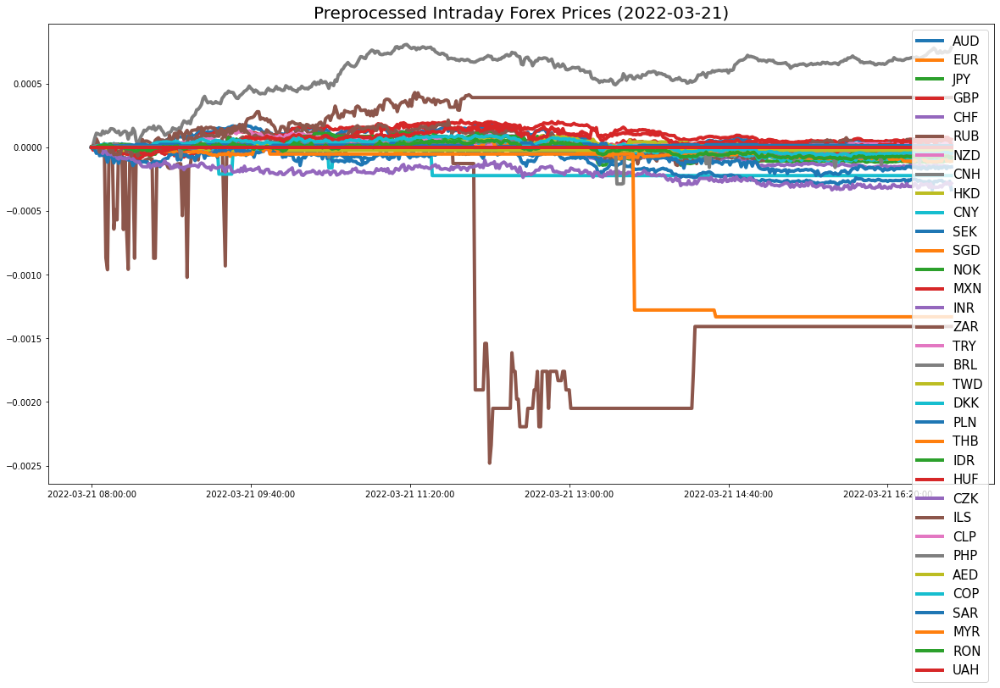

In [19]:
forex_abbrevs = ['AUD','EUR','JPY','GBP','CHF','RUB','USD','NZD','CNH','HKD','CNY',
                    'SEK','SKW','SGD','NOK','MXN','INR','ZAR','TRY','BRL','TWD','DKK',
                    'PLN','THB','IDR','HUF','CZK','ILS','CLP','PHP','AED','COP','SAR',
                    'MYR','RON','UAH'] 

date = '2022-03-21'

                
intraday_forex_prices_df=FetchPrices(forex_abbrevs, 'forex').fetch_intraday_prices_df(date)
plot_df(intraday_forex_prices_df, title='Preprocessed Intraday Forex Prices ({})'.format(date))


## Lead Lag Matrix

In [20]:
IntradayForexCA=CyclicityAnalysis(intraday_forex_prices_df)
IntradayForexCA.plot_lead_lag_df()

## Top 10 Leader Follower Pairs

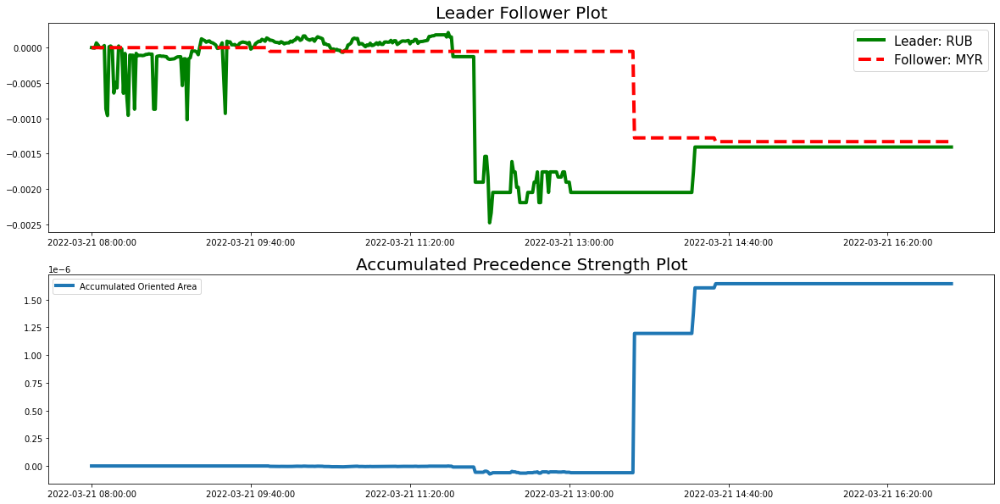

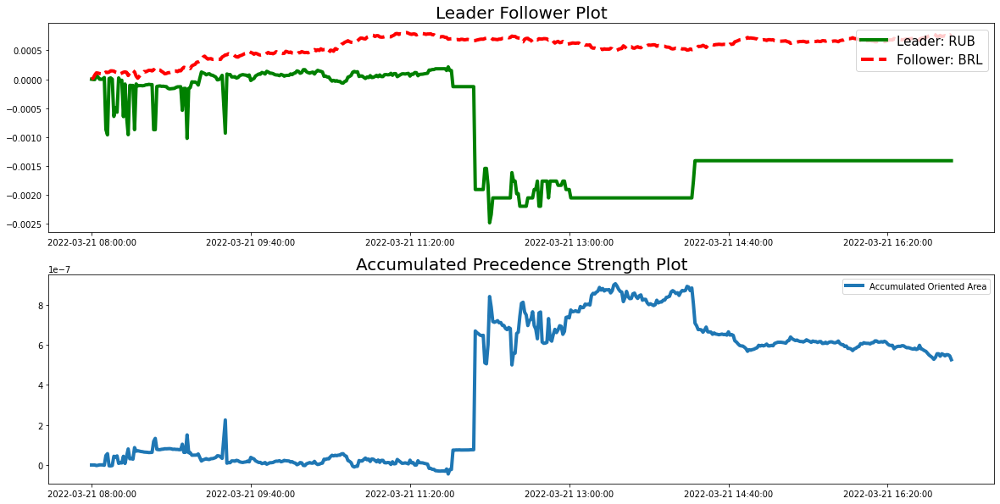

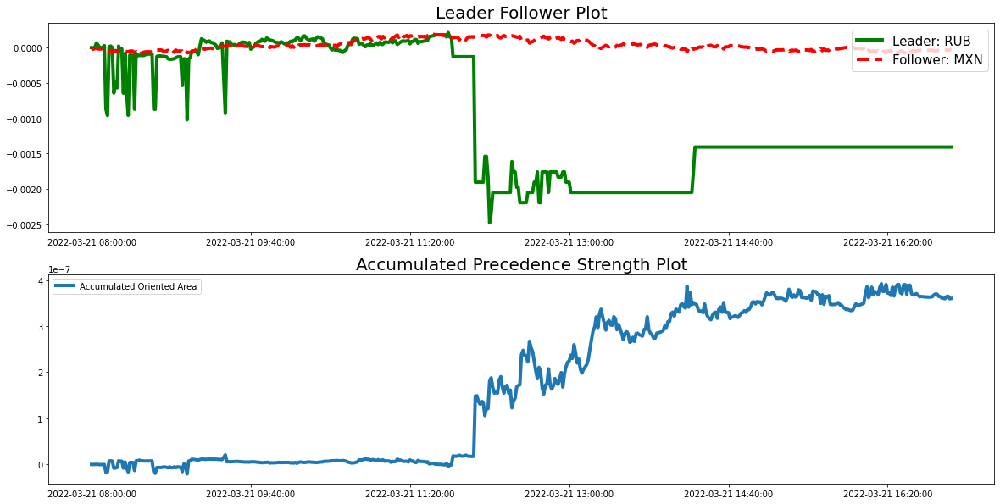

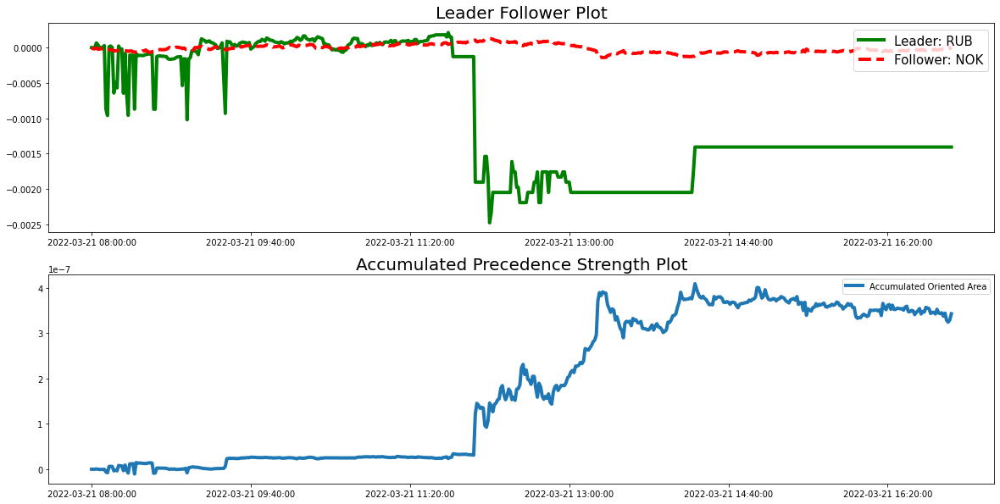

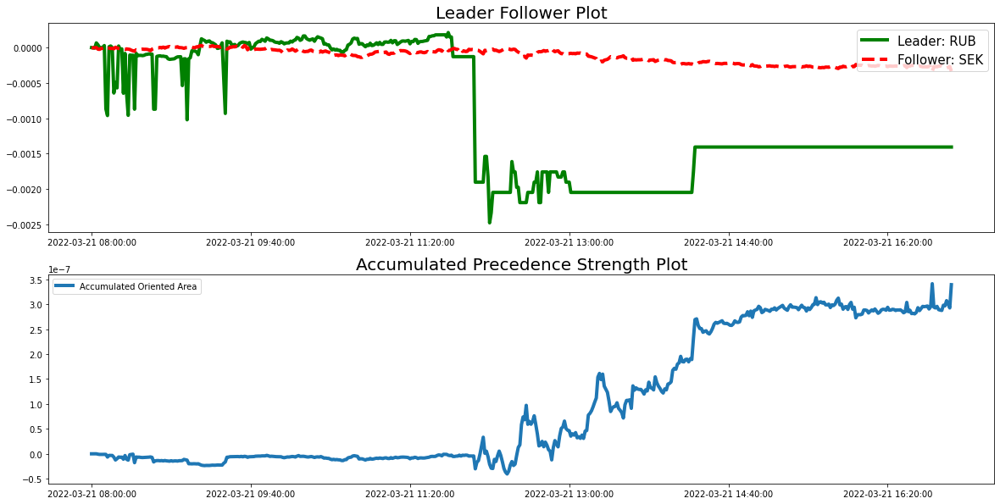

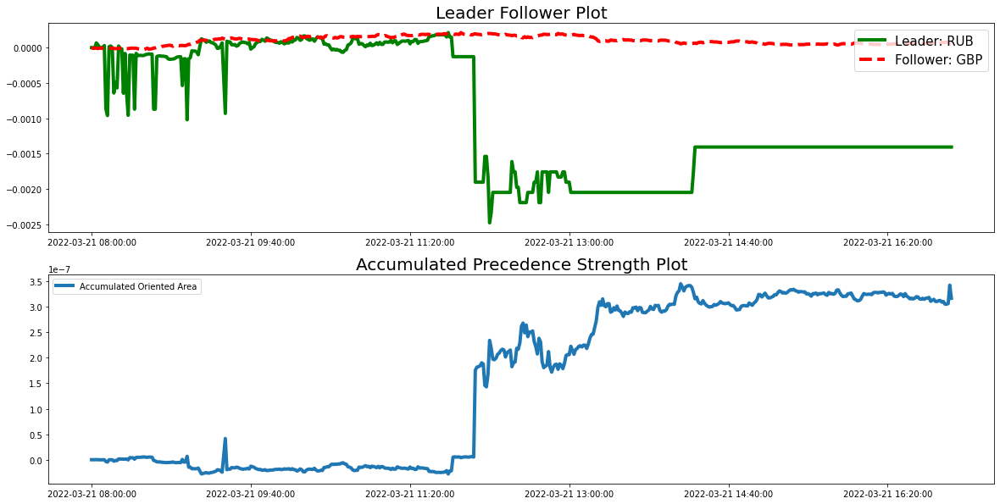

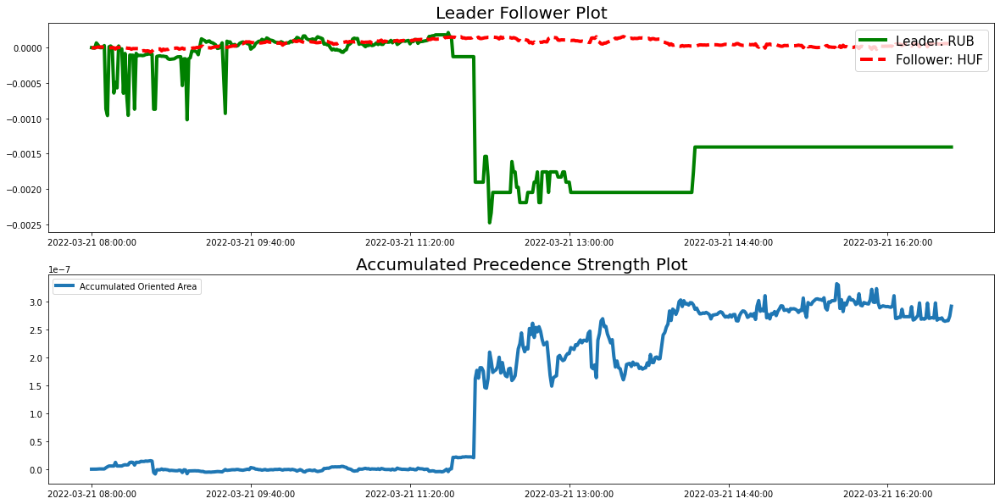

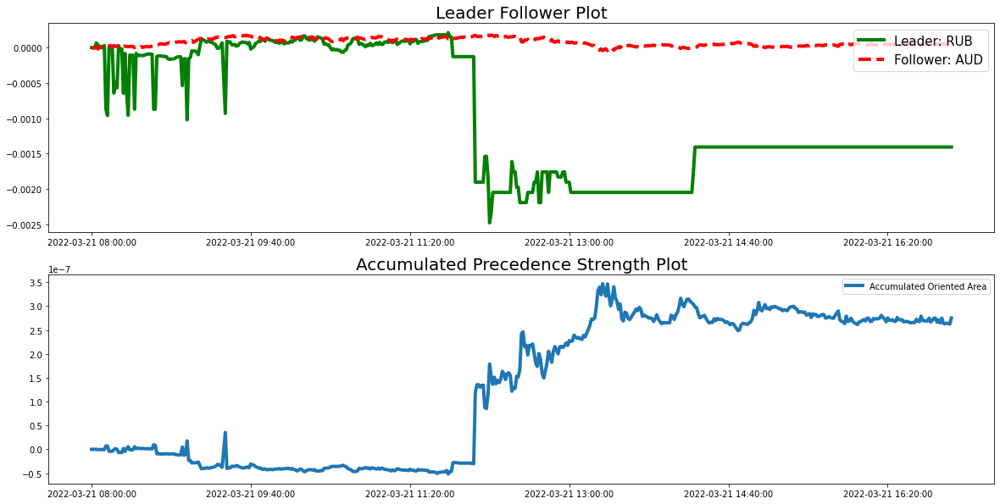

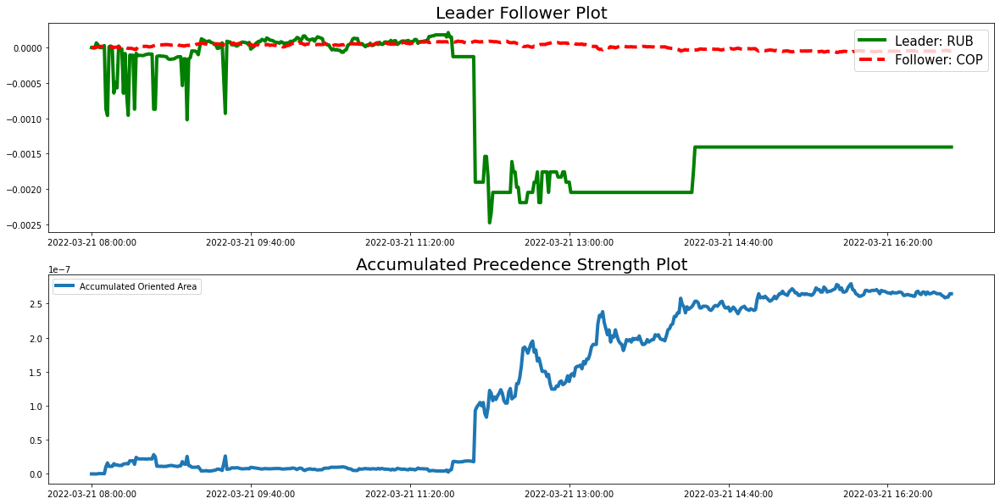

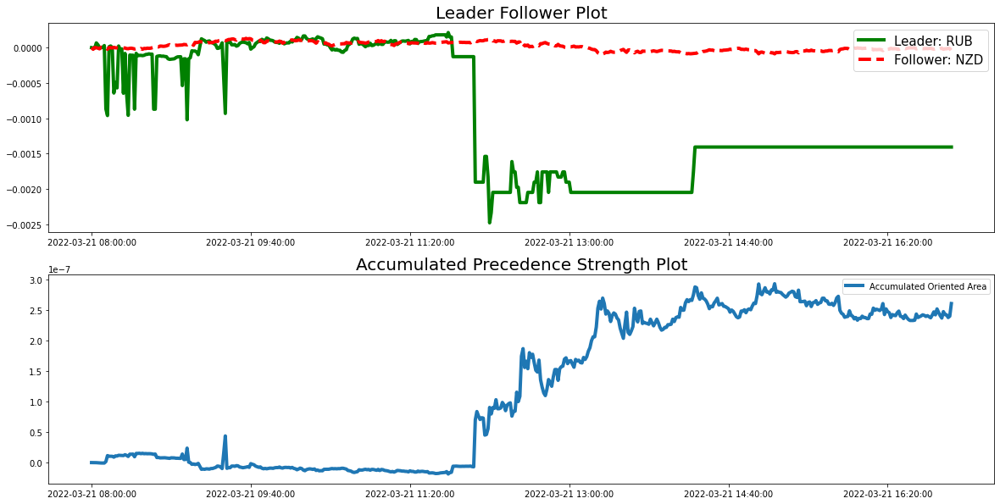

In [21]:
for pair in IntradayForexCA.get_topN_leader_follower_pairs(N=10):
    leader,follower=pair
    plot_leader_follower_relationship(intraday_forex_prices_df, 
                                          leader, 
                                          follower, 
                                          figsize=(20,10),
                                          include_accumulated_oriented_area_plot=True)

## Intraday Forex Leader Follower Statistics

In [22]:
save_directory="FOREX Intraday Leader Followers"
start_date, end_date ='2021-12-01', '2022-03-21'
LFA=LeaderFollowerFrequencyAnalysis(forex_abbrevs,'forex',start_date, end_date, save_directory=save_directory)
LFA.plot_strong_frequency_counts_df(title='FOREX Strong Frequency Matrix ({} - {})'.format(start_date, end_date))

/Users/VivekKaushik 1/PycharmProjects/StockMarketAnalysis/LeaderFollowerFrequencyAnalysis.py:64: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/VivekKaushik 1/PycharmProjects/StockMarketAnalysis/LeaderFollowerFrequencyAnalysis.py:65: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

